# Make Figures for Human Data

This notebook is used to make figures using data from human (K409, K411, K468, K484 and integrated objects) for the blood/tumor project. For each sample, there are at least two tissues (blood and tumor), and for each tissue there is a count matrix and a TCR metadata file. For K409, there is a tumor and lymph node (LN) sample, and for both K411 and K468, there blood and longitudinal blood samples.

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.transforms import Bbox
import seaborn as sns
import scipy
import matplotlib as mpl
from matplotlib import cm                                                   # To make custom heat maps
from matplotlib.colors import ListedColormap, LinearSegmentedColormap       # To make custom color maps
import anndata
import scanpy as sc
from matplotlib.ticker import ScalarFormatter,MultipleLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
from collections import Counter
from openpyxl import load_workbook
import xlsxwriter
import palettable
import os
from palettable.cartocolors.sequential import PurpOr_7
from matplotlib_venn import venn3_unweighted

# Set a seed
np.random.seed(2)

# Check to see if output directories exist

In [2]:
for folder in ['Figures', 'Outputs']:
    if not os.path.isdir(folder):
        os.mkdir(folder)

# Create Functions

### Create a Function to Save Subplots

In [2]:
# From https://stackoverflow.com/questions/4325733/save-a-subplot-in-matplotlib

def full_extent(ax, pad_x=0.0, pad_y=0.0):
    """Get the full extent of an axes, including axes labels, tick labels, and
    titles."""
    # For text objects, we need to draw the figure first, otherwise the extents
    # are undefined.
    ax.figure.canvas.draw()
    items = ax.get_xticklabels() + ax.get_yticklabels() 
    items += [ax, ax.title, ax.xaxis.label, ax.yaxis.label]
    bbox = Bbox.union([item.get_window_extent() for item in items])

    return bbox.expanded(1.0 + pad_x, 1.0 + pad_y)

### Create a Function to call only AB Clones

In [3]:
def AB_Clones(Adata, non_AB=False):
    """
    This function takes an Adata object and returns all the cells that have at least one alpha and
    one beta chain.
    
    The 'non_AB' option (Boolean) asks the user to specify if they want to return the non-AB cells as well.
    Default is False, meaning that only the AB cells will be returned.
    """
    
    # Adata object with AB clones
    Adata_AB = Adata[ ~ Adata.obs['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # Adata object with non-AB clones
    Adata_non_AB = Adata[ Adata.obs['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # Remove the unused categories
    Adata_AB.obs['Matching'].cat.remove_unused_categories(inplace=True)
    Adata_non_AB.obs['Matching'].cat.remove_unused_categories(inplace=True)
    
    # If user asks to return the non-AB clones, return both
    if non_AB:
        return Adata_AB, Adata_non_AB
    
    # Otherwise, return just the AB clones
    else:
        return Adata_AB

### Create a Function to Initialize the Number of Plots

In [4]:
def MakeFigAxes(ncols, n_axes, figsize=(10,8), constrained_layout = False):
    
    # Determine how many rows are needed
    if n_axes%ncols == 0:
        nrows = int(n_axes/ncols)
    else:
        nrows = int(1+ int(n_axes/ncols))
    
    # Special case if only using one row
    if nrows == 1:
        fig, axes = plt.subplots(nrows = nrows, ncols = n_axes, figsize = figsize,
                                 constrained_layout = constrained_layout)
        axes = np.array(axes)
        axes.shape = (n_axes,)
    
    # For more than 1 row
    else:
        fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize,
                                 constrained_layout = constrained_layout)
    
        # Delete unnecessary axes
        if n_axes != nrows*ncols:
            n_axes_to_delete = (nrows*ncols - n_axes)
            for i in range(1,n_axes_to_delete+1):
                ax = axes.flatten()[-i]
                fig.delaxes(ax)
                
    return fig, axes

### Create a Function to Find Intersection of Genes

In [5]:
def IntersectionOfGenes(object1, object2, sort = False, upper = False):
    """
    This function returns the genes in the intersection of two objects. If the object is an Adata object,
    then the gene names are used (Adata.var_names). Otherwise, the function expects a set or a list of genes.
    
    This code is NOT optimized for speed - rather, the goal is to return the intersection of genes:
    - in the order of the first list
    - regardless of whether or not either list is upper or lower case
    
    Inputs
    ------
    object1: An Adata object, a list of genes, or a set of genes.
    object2: An Adata object, a list of genes, or a set of genes.
    sort (Bool): Sorts the final output. Default is False (genes will be return in the order of object1)
    upper (Bool): Upper-cases the final output. Default is False (genes will be returned in the original case)
    """
    
    ### Parse the inputs and see if they're lists or Adata objects ###
    
    import anndata
    
    # Initialize an empty object to store the lists
    Lists = [0, 0]
    
    # Loop over each input object
    for i,obj in enumerate([object1, object2]):
        
        # If the object is an Adata object, extract the genes as a list
        if type(obj) == anndata._core.anndata.AnnData:
            Lists[i] = list(obj.var_names)
        
        else:
            # Otherwise,  object is assumed to be a list or set - therefore, turn it into a list.
            Lists[i] = list(obj)
            
            
    # Now we have two gene lists
    list1 = Lists[0]
    list2 = Lists[1]
    
    ### Find the intersection of both lists ###
    
    # Initialize a list of False values
    TrueFalse = [False] * len(list1)
    
    # Make both genes upper case to find the intersection
    List1 = list(map(str.upper, list1))
    List2 = list(map(str.upper, list2))
    
    # For each gene in the first list, if it exists in the second list,
    # then set its truth value to True
    for i,gene in enumerate(List1):
        if gene in List2:
            TrueFalse[i] = True
            
    # Create an object to be returned by doing the following:
    ListToReturn = np.array(list1)             # Turn the original list into a NumPy array
    ListToReturn = ListToReturn[TrueFalse]     # Keep only the genes that are in the intersection
    ListToReturn = list(ListToReturn)          # Return it to a list to to use list methods
          
    # Sort the genes, if specified
    if sort == True:
        ListToReturn.sort()
        
    # Upper case all the genes, if specified
    if upper == True:
        ListToReturn = list(map(str.upper, ListToReturn))
    
    # Return the list
    return ListToReturn

# Load sample names

In [6]:
samples = ['K409_Blood', 'K409_Tumor', 'K409_LN',
           'K411_Blood', 'K411_Tumor', 'K411_Blood_Longitudinal',
           'K468_Blood', 'K468_Tumor', 'K468_Blood_Longitudinal',
           'K484_Blood', 'K484_Tumor']

# Load Adata Objects (individual samples)

In [7]:
# Initialize empty objects
Adatas = [0] * len(samples)

# Path where adata objects are located
adata_path = 'Path/to/ScanpyObjects/'

# Loop over each sample
for i,sample in enumerate(samples):
    
    Adatas[i] = anndata.read_h5ad(adata_path + sample + '.h5ad')
    
    print("{} cells in {}".format(len(Adatas[i]), sample))

5119 cells in K409_Blood
1989 cells in K409_Tumor
4371 cells in K409_LN
2543 cells in K411_Blood
3737 cells in K411_Tumor
18524 cells in K411_Blood_Longitudinal
8919 cells in K468_Blood
4878 cells in K468_Tumor
19080 cells in K468_Blood_Longitudinal
5252 cells in K484_Blood
1903 cells in K484_Tumor


# Load Gene Lists

In [74]:
# Text files
with open('GeneLists/cd8_activation_sarkar_up.txt', 'r') as f:
    sarkar_activation = f.read().splitlines() 
    
with open('GeneLists/cell_cycle_all_strong.txt', 'r') as f:
    cellcycle = f.read().splitlines() 
    
with open('GeneLists/KAECH_NAIVE_VS_DAY8_EFF_CD8_TCELL_UP.txt', 'r') as f:
    kaech_naive = f.read().splitlines()

In [86]:
def LoadEffNaiveGenes():
    """
    Load Activation/Effector signature and Naive signatures.
    """
    
    # Load from Excel file
    Eff = pd.read_excel('GeneLists/CD8_Effector_vs_Naive_antigen.xlsx', sheet_name = 'Effector', index_col=0)
    Naive = pd.read_excel('GeneLists/CD8_Effector_vs_Naive_antigen.xlsx', sheet_name = 'Naive', index_col=0)
    
    # Drop genes with no names
    Eff = Eff.loc[~Eff.index.isna()]
    Naive = Naive.loc[~Naive.index.isna()]

    # Drop duplicates
    Eff = Eff[~Eff.index.duplicated(keep='first')]
    Naive = Naive[~Naive.index.duplicated(keep='first')]
    
    # Upper case all genes
    Eff = list(Eff.index.str.upper())
    Naive = list(Naive.index.str.upper())
    
    # Make empty lists
    Eff_filtered = []
    Naive_filtered = []
    
    # Remove poorly named genes (genes with '///' in the name) for Eff
    for gene in Eff:
        if '/' not in gene:
            Eff_filtered.append(gene)
            
        else:
            genes = gene.split('///')
            for g in genes:
                Eff_filtered.append(g)
                
    # Remove poorly named genes (genes with '///' in the name) for Eff
    for gene in Naive:
        if '/' not in gene:
            Naive_filtered.append(gene)
            
        else:
            genes = gene.split('///')
            for g in genes:
                Naive_filtered.append(g)
            
            
            
    
    return Eff_filtered, Naive_filtered

Eff, Naive = LoadEffNaiveGenes()

In [87]:
# Load Sade-Feldman genes
def LoadSF(SF, gene_name):
    """
    Load gene signatures from Sade-Feldman paper.
    """
    
    
    df = SF[gene_name]
    df = df[~df.isna()]
    df = list(df)
    return df

# Load Excel file
SF = pd.read_excel("GeneLists/SadeFeldman_TableS4.xlsx", sheet_name = "Gene markers-Fig4A-B", header=1)
SF_CD8 = [0] * 6
GeneNames = ['GeneName']+['GeneName.'+str(i) for i in range(1,6)]

for i,gene_name in enumerate(GeneNames):
    SF_CD8[i] = LoadSF(SF, gene_name)

# Create a Function to Make Titles

In [23]:
def MakeTitle(sample):
    """
    This function takes a string that is separated by underscores and 
    replaces the underscores with spaces.
    """
    
    return sample.replace('_', ' ')

# Plot UMAPs by Cluster

### Create a Function for Plotting Seurat Clusters on UMAPs

In [156]:
def PlotUMAPs(Adata, title):
    
    df = Adata.obs.copy()
    
    # Make a list of colors for the scatterplot
    Colors = list(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    Colors2 = ['red','black','blue','green','orange','yellow','brown','magenta','pink','gray',
               'purple','tan','lightblue','lightgreen']

    Colors.extend(Colors2)
    
    # Maximum number of clusters
    seurat_list = list(df['Seurat_clusters'])
    max_cluster = len(list(np.unique(seurat_list)))
    
    # Make an empty list, each element will be a dataframe separated by cluster
    clusters = [0] * (max_cluster+1)
    
    # Make a list of colors that correspond to each seurat cluster
    c = []

    for cluster_number in list(df['Seurat_clusters']):
        c.append(Colors[cluster_number])


    # Plot the clusters  
    fig, ax = plt.subplots(figsize=(10,8))
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Seurat_clusters', palette=Colors[0:max_cluster],
                   legend = 'full', ax=ax, s = 10, linewidth=0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    
    new_labels = ['Cluster ' + str(i) for i in np.unique(df['Seurat_clusters'])]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=new_labels)
    
    ax.set_title(title + " ({} cells)".format(len(df)))
        
    plt.show()
    
    return fig,ax

### Plot Seurat Clusters on UMAPs

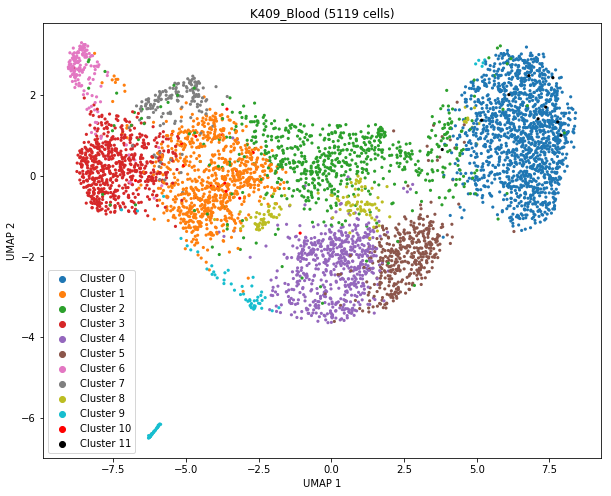

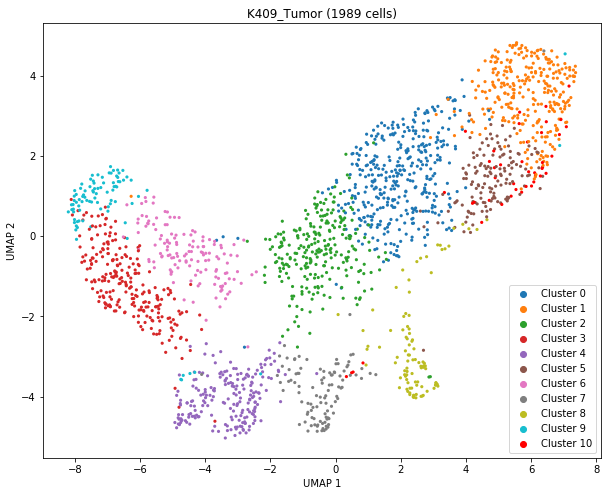

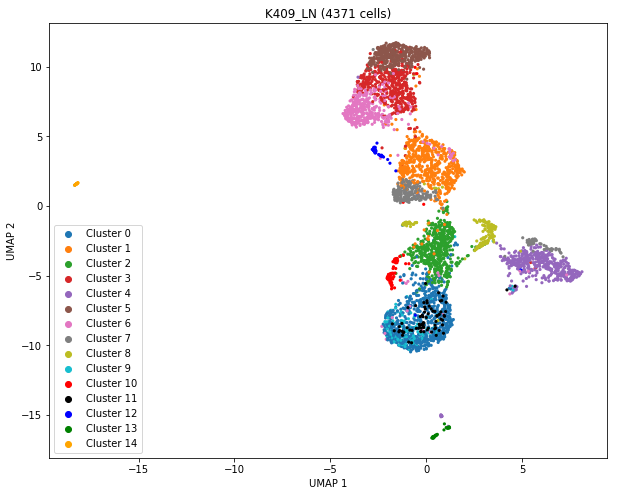

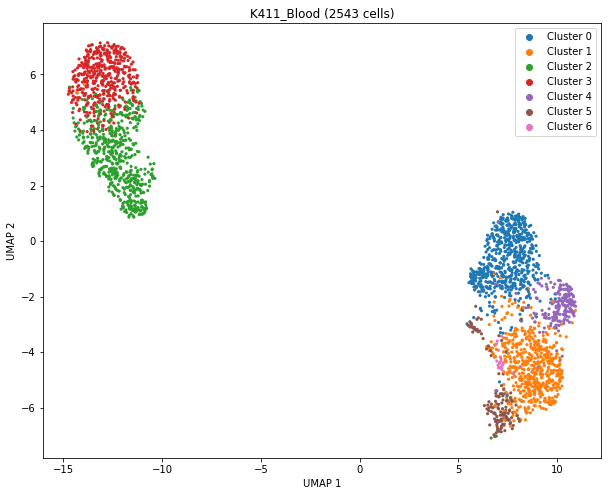

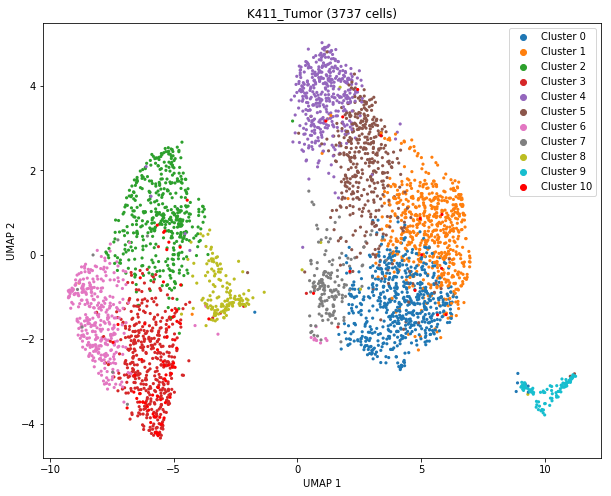

...

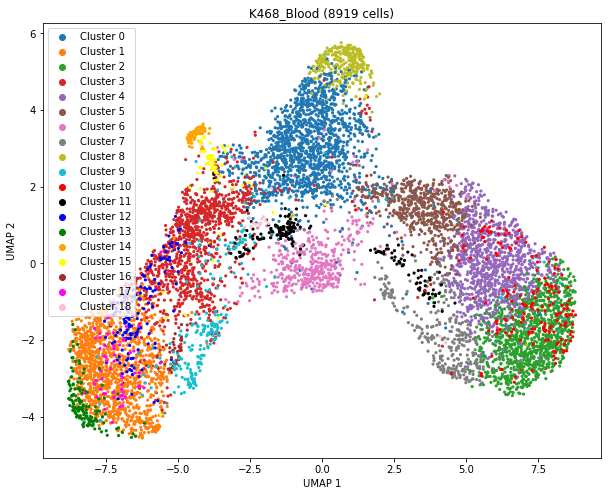

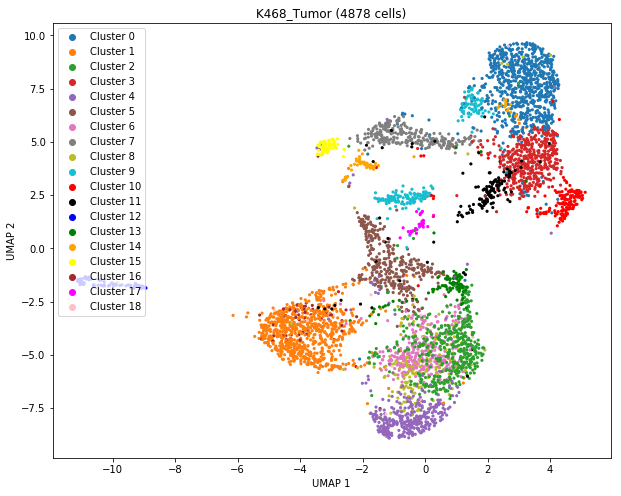

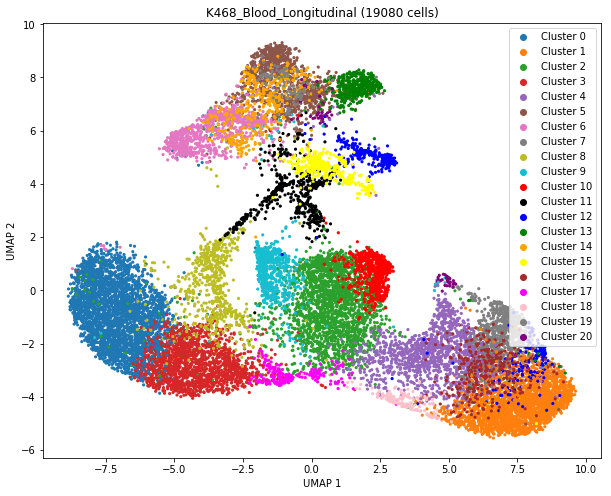

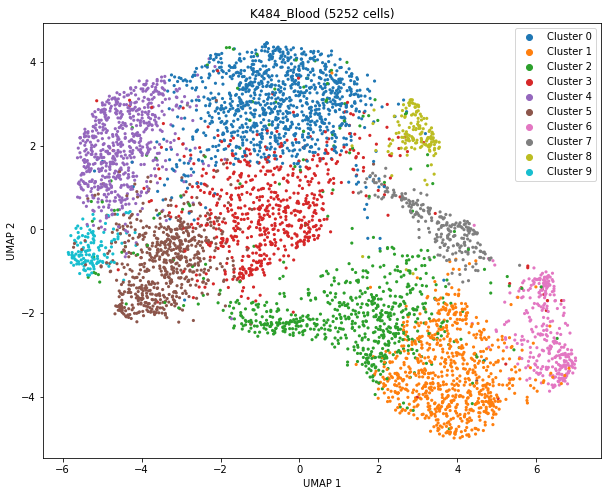

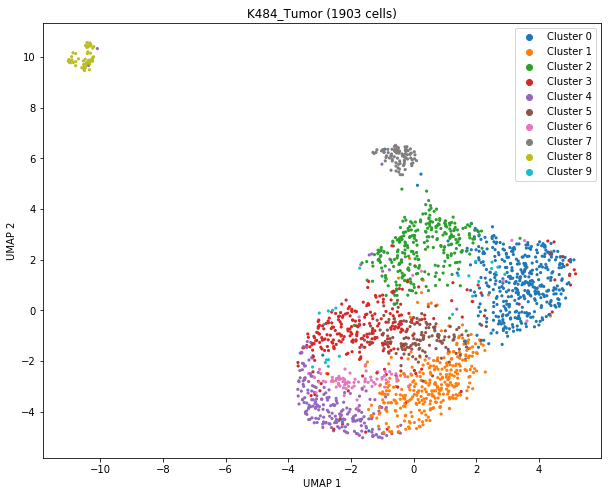

In [169]:
for i,sample in enumerate(samples):
    PlotUMAPs(Adatas[i], sample)

# Plot UMAPs and color by AB clone

In [30]:
def PlotABclone(Adata, sample):
    """
    Plots the cells from a given sample, and color them based on whether or not the cell
    is an AB cells or not (AB cell = cell with at least one alpha and one beta chain).
    """
    
    # Call AB or non-AB cells
    Adata_AB, Adata_non_AB = AB_Clones(Adata, non_AB = True)
    df_AB = Adata_AB.obs.copy()
    df_nAB = Adata_non_AB.obs.copy()
    
    df_AB['Matching'] = 'AB Clone'
    df_nAB['Matching'] = 'Not AB Clone'
    
    df = pd.concat([df_AB, df_nAB])
    
    fig, ax = plt.subplots(figsize=(10,8))
    
    # Make the plot
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching', palette = ['black','red'],
                   hue_order = ['Not AB Clone', 'AB Clone'], ax = ax, s = 10, linewidth = 0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(MakeTitle(sample) + ' - {} Cells'.format(len(Adata)))
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    
    return fig, ax

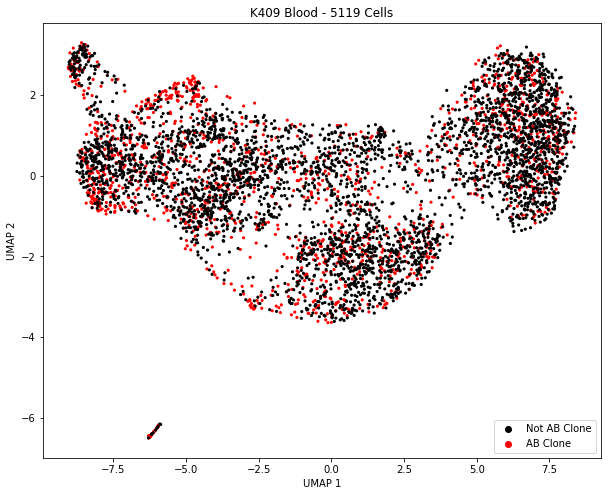

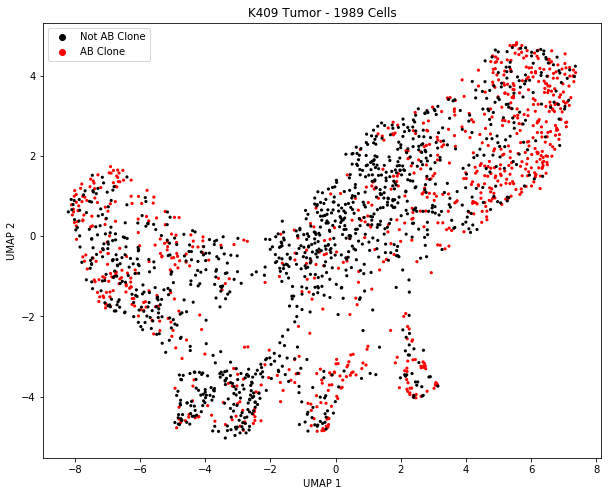

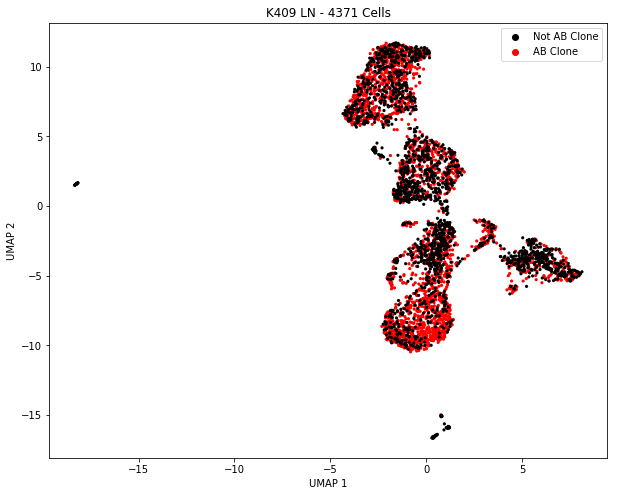

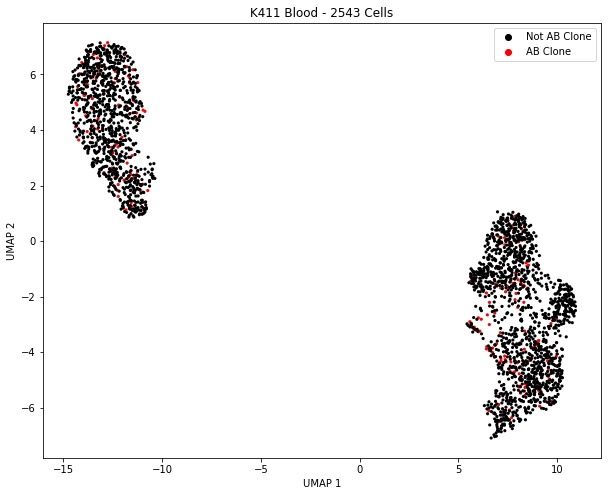

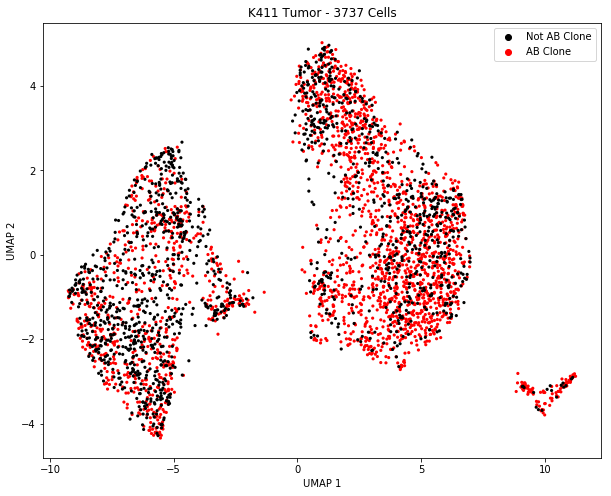

...

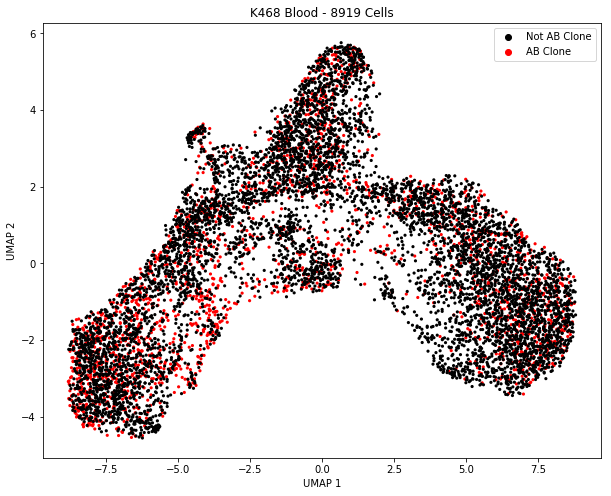

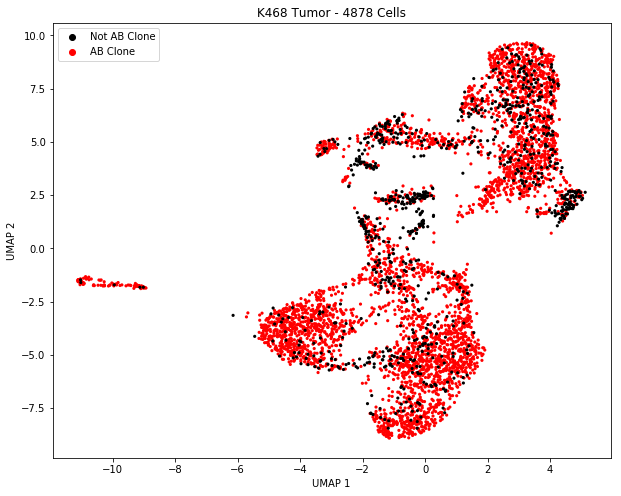

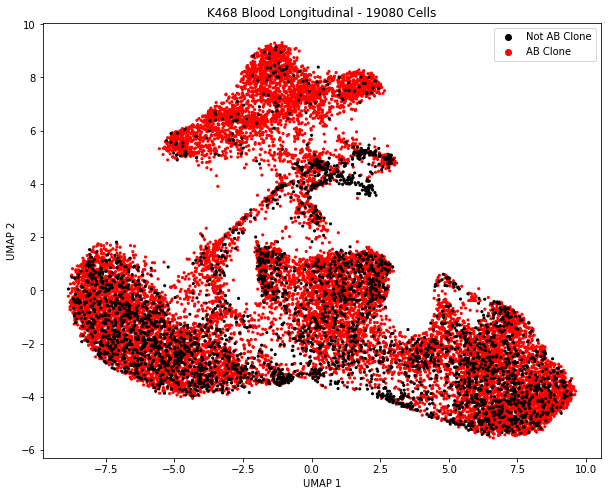

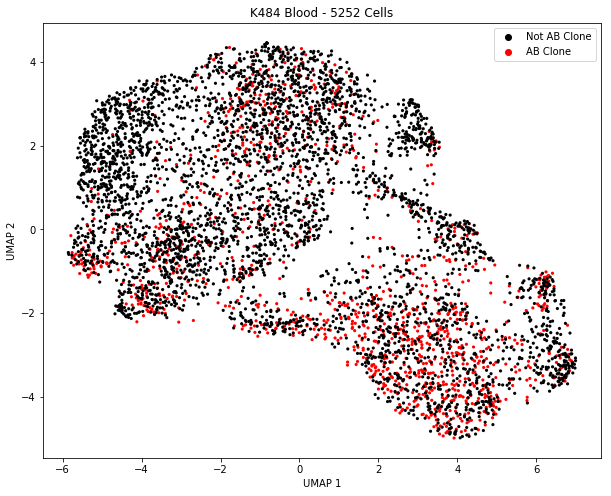

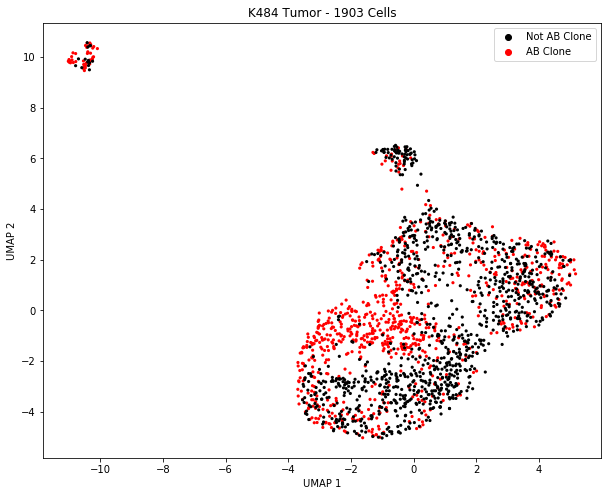

In [31]:
for i,sample in enumerate(samples):
    
    fig, ax = PlotABclone(Adatas[i], sample)

# Make Plots for Matching vs. non-Matching Cells

In [40]:
def Matching_UMAP(Adata, sample):
    """
    Plots the cells from a given sample, and colors them based on whether or not the cell
    is an matching cell.
    """
    
    # Keep only AB cells
    df = AB_Clones(Adata).obs.copy()
    
    # Set up figure
    fig, ax = plt.subplots(figsize=(10,8))
    
    # Plot data
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching', palette = ['black','red'],
                   hue_order = ['not_matching', 'matching'], ax = ax, s = 10, linewidth = 0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(MakeTitle(sample) + ' - {} Cells'.format(len(Adata)))
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    
    plt.show()
    
    return fig, ax

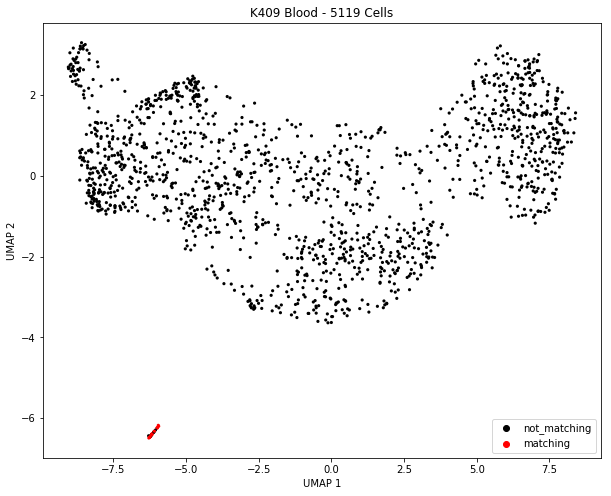

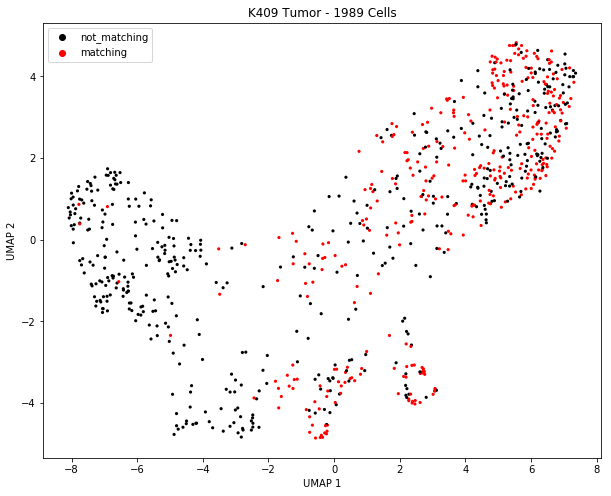

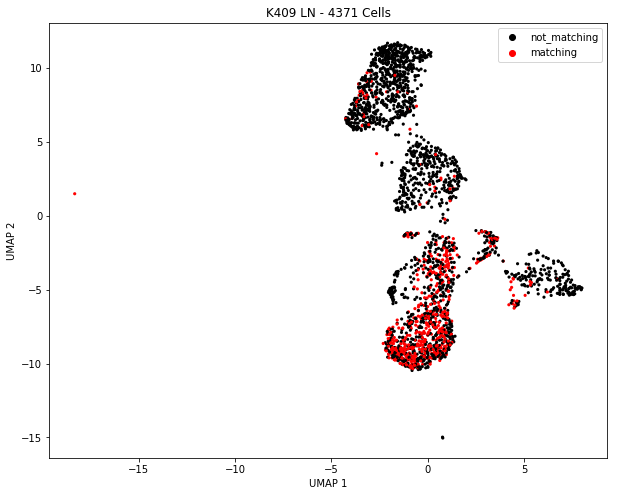

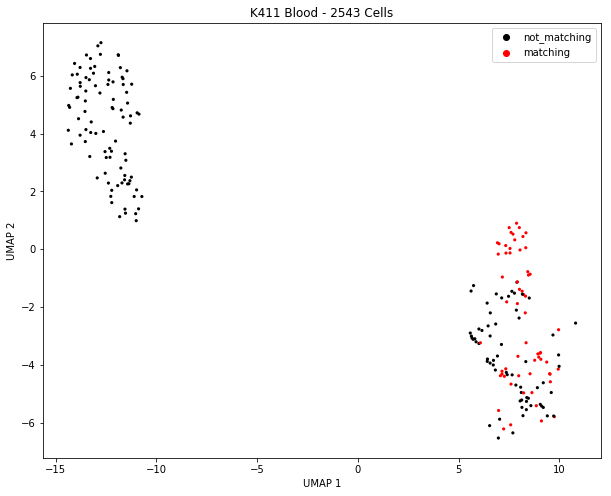

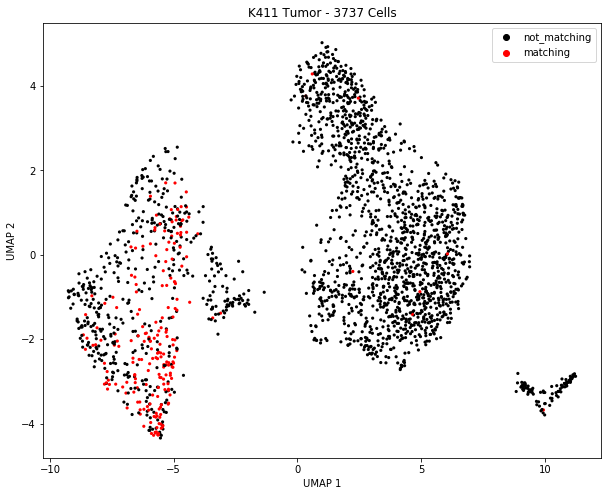

...

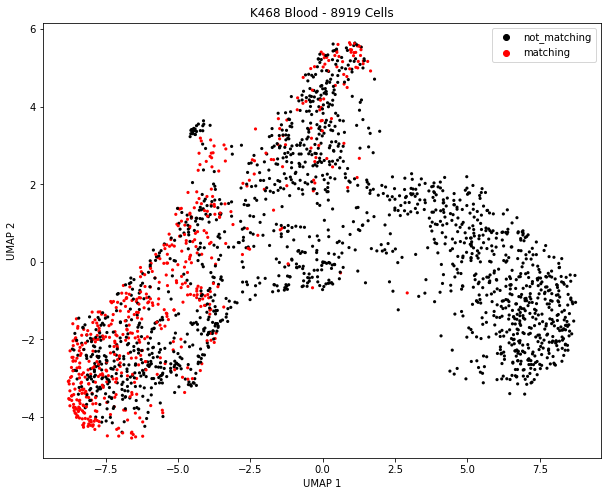

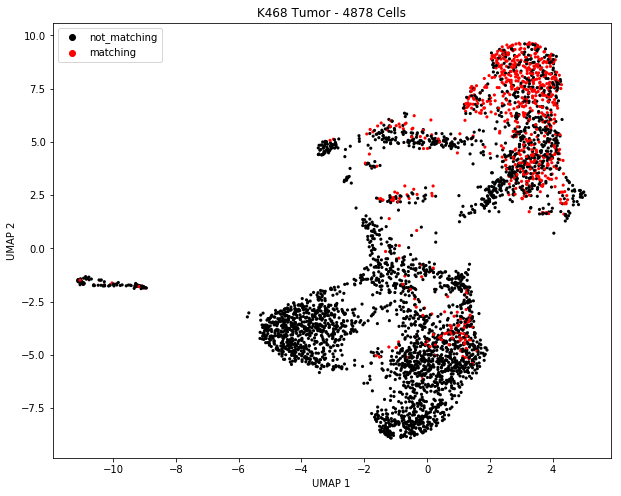

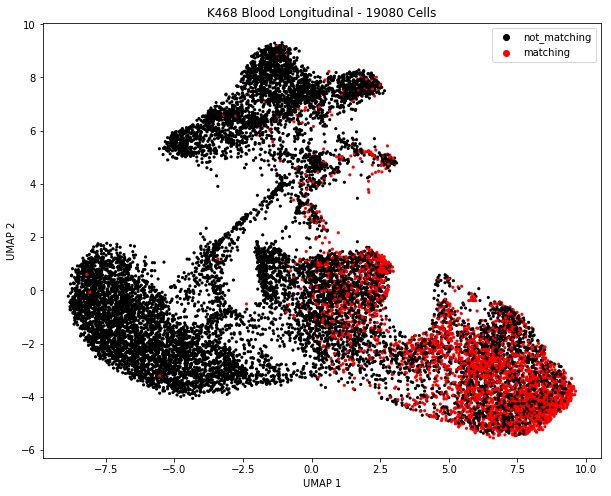

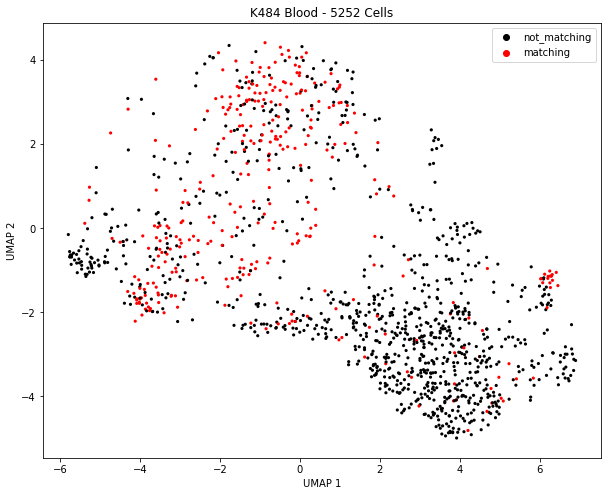

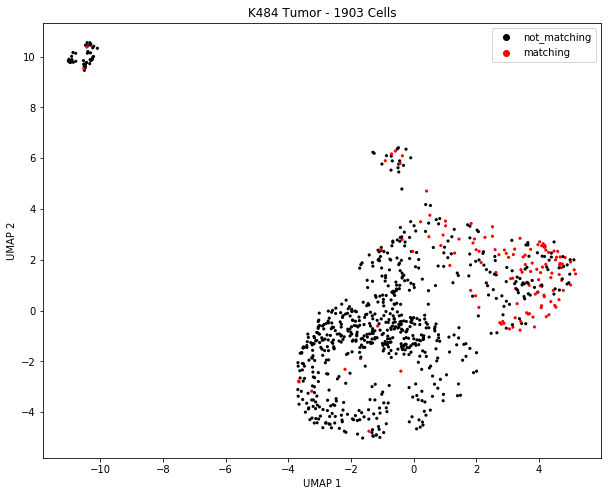

In [42]:
for i,sample in enumerate(samples):
    
    Matching_UMAP(Adatas[i], sample)

# Pie Charts (PD1+) - By Matching

### Create Function

In [54]:
def MakePD1PieCharts(Adata, sample):
    
    # Keep the metadata
    df = AB_Clones(Adata).obs.copy()
    
    # Separate matching and non-matching cells
    M = df[ df['Matching'] != 'not_matching' ].index
    nM = df[ df['Matching'] == 'not_matching' ].index
    
    # Call gene column for PD1, matching cells
    PD1 = Adata[M, 'PDCD1'].X
    
    # Number of M cells that are PD1+
    matching_pd1P = np.count_nonzero(PD1)
    
    # Number of M cells that are PD1-
    matching_pd1N = len(PD1) - matching_pd1P
    
    # Call gene column for PD1, nM cells
    PD1 = Adata[nM, 'PDCD1'].X
    
    # Number of TM cells that are PD1+
    not_matching_pd1P = np.count_nonzero(PD1)
    
    # Number of TM cells that are PD1-
    not_matching_pd1N = len(PD1) - not_matching_pd1P
    
    # Make pie charts
    colors = ['#ff9999','#66b3ff']
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 4))

    # Pie chart, matching cells
    labels = ['PD1+\n({} cells)'.format(matching_pd1P), 'PD1-\n({} cells)'.format(matching_pd1N)]
    ax1.pie([matching_pd1P,matching_pd1N], labels=labels, shadow=True, autopct='%1.1f%%', colors = colors)
    ax1.axis('equal')
    ax1.set_title('Matching Cells ({} cells)'.format(len(M)))

    # Pie chart, non-matching cells
    labels = ['PD1+\n({} cells)'.format(not_matching_pd1P), 'PD1-\n({} cells)'.format(not_matching_pd1N)]
    ax2.pie([not_matching_pd1P,not_matching_pd1N], labels=labels, shadow=True, autopct='%1.1f%%',
           colors = colors)
    ax2.axis('equal')
    ax2.set_title('Non-Matching Cells ({} cells)'.format(len(nM)))
    
    fig.suptitle(MakeTitle(sample) + ' ({} cells)\n\n\n\n'.format(len(df)))
    
    return (ax1, ax2)

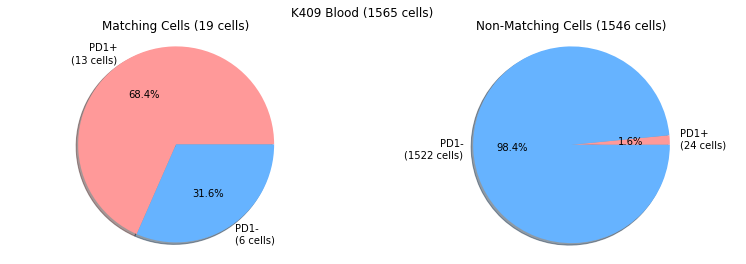

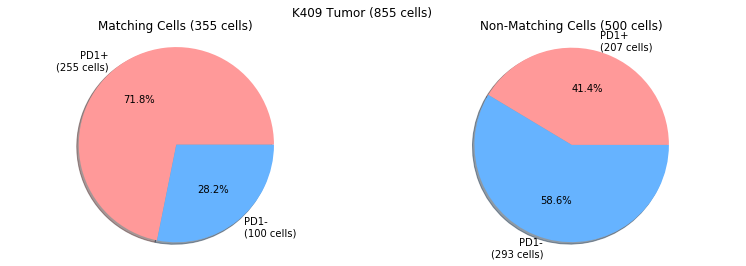

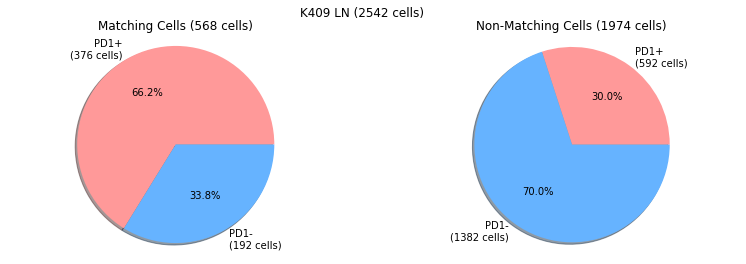

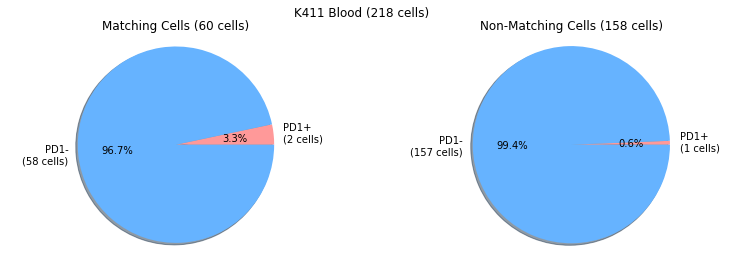

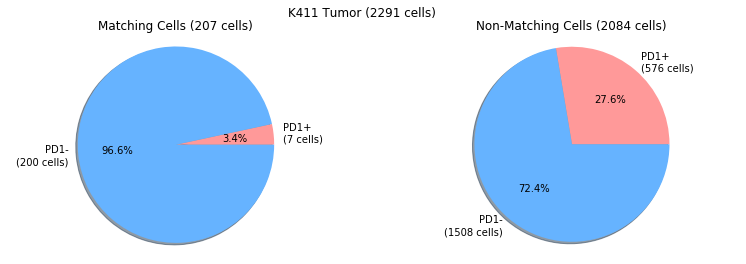

...

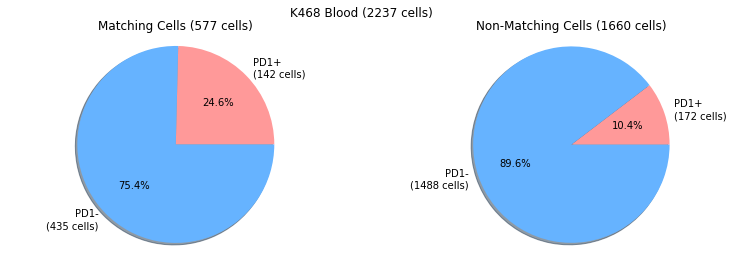

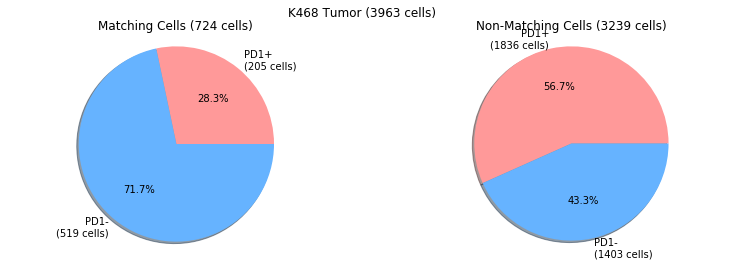

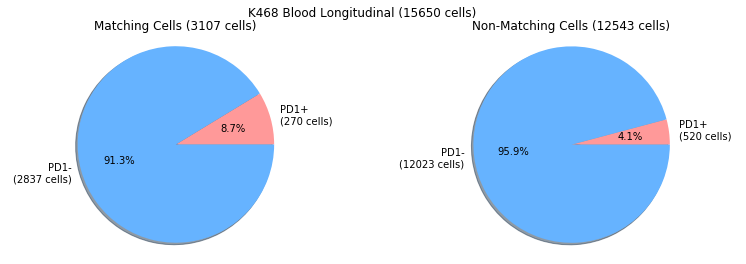

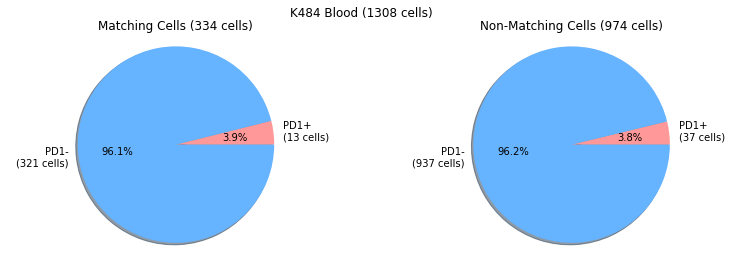

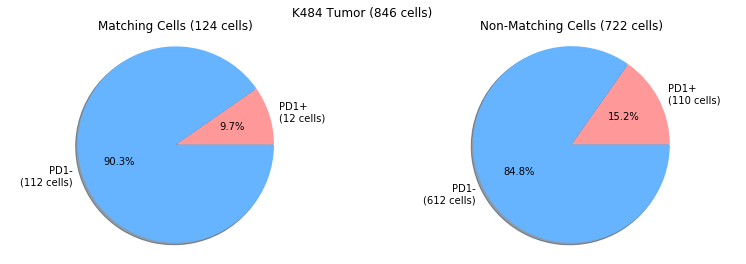

In [55]:
for i,sample in enumerate(samples):
    
    ax1, ax2 = MakePD1PieCharts(Adatas[i], sample)
    
    if sample in ['K409_Blood', 'K411_Blood', 'K468_Blood', 'K484_Blood']:
        plt.savefig('Figures/Fig6A_{}_PD1piechart.pdf'.format(sample))
    
    plt.show()

# Violin Plots

### Make Functions

In [72]:
def CapScores(score_list, thresh_low = 3, thresh_high = 3):
    """
    This function takes a list of gene scores (one score per cell) and fits it to a normal distribution,
    estimating a mean (mu) and standard deviation (SD). Then it caps the scores that are above a certain
    threshold and caps the scores that are below another threshold.
    
    This action should only be done for visualization purposes, and not for doing any statistical tests.
    
    Inputs
    ------
    score_list: A list of gene scores.
    thresh_low:  The number of standard deviations away from the mean to cap the lower scores.
    thresh_high: The number of standard deviations away from the mean to cap the upper scores.
    
    For both thresholds, the default behavior is that any scores that are 3 SDs above or
    below the mean will be capped.
    
    Output
    ------
    score_list: The capped list of gene scores.
    """
    
    # Fit the gene scores to a normal distribution
    mu, SD = scipy.stats.norm.fit(score_list)
    
    # Cap the scores
    thresh_high = mu + thresh_high * SD
    thresh_low  = mu - thresh_low  * SD
    
    for e,ele in enumerate(score_list):
        
        if ele >= thresh_high:
            score_list[e] = thresh_high
            
        if ele <= thresh_low:
            score_list[e] = thresh_low
            
    return score_list

In [80]:
def MakeViolinPlots(sample, Adata, gene_lists, gene_names, figsize = (10,13), Cap = False):
    
    pd.options.mode.chained_assignment = None
    
    # Keep only AB cells
    Adata = AB_Clones(Adata).copy()
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    # Label cell as 'M' or 'nM' for 'Matching' or 'Not Matching'
    Adata.obs['Matching'] = ['nM' if match == 'not_matching' else 'M' for match in Adata.obs['Matching'] ]
    
    
    # Make the figure and axes
    fig, axes = MakeFigAxes(ncols = 2, n_axes = len(gene_lists), figsize = figsize)
    
    
    # Loop over gene lists
    for i,(gene_list,gene_name) in enumerate(zip(gene_lists,gene_names)):
    
        # Find the intersection of the gene list and the genes in the adata object
        genes_to_plot = IntersectionOfGenes(Adata, gene_list)

        # Find gene scores
        sc.tl.score_genes(Adata, genes_to_plot, score_name = gene_name)

        # Create two lists to calculate statistics
        M = Adata[ Adata.obs['Matching'] == 'M' ].obs
        nM = Adata[ Adata.obs['Matching'] == 'nM' ].obs

        # p-value and differences
        stat,pval = scipy.stats.ranksums(M[gene_name], nM[gene_name])
        diff_mean = np.mean(M[gene_name]) - np.mean(nM[gene_name])
        diff_median = np.median(M[gene_name]) - np.median(nM[gene_name])
        
        # Cap scores, if specified, for visualization
        if Cap == True:
            Adata.obs[gene_name] = CapScores(Adata.obs[gene_name])
            
        # Get axis
        ax = axes.flatten()[i]
    
        sns.violinplot(x = 'Matching', y = gene_name, data = Adata.obs, ax = ax, order = ['nM','M'])

        title1 = sample + ', {} genes\n'.format(gene_name)
        title2 = 'p-val = {:.2g}\n'.format(pval)
        title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
        title4 = 'Difference in medians = {:.2g}'.format(diff_median)
        title = title1 + title2 + title3 + title4

        ax.set_title(title)
        ax.set_ylabel(gene_name)
        
    # Tight layout
    plt.tight_layout()
    
    return fig,axes

### Specify Gene Lists

In [97]:
gene_lists = [sarkar_activation, cellcycle, kaech_naive, Eff, Naive]
gene_names = ['Sarkar (Activation)', 'Cell Cycle', 'Kaech (Naive)', 'Activation/Effector', 'Naive']

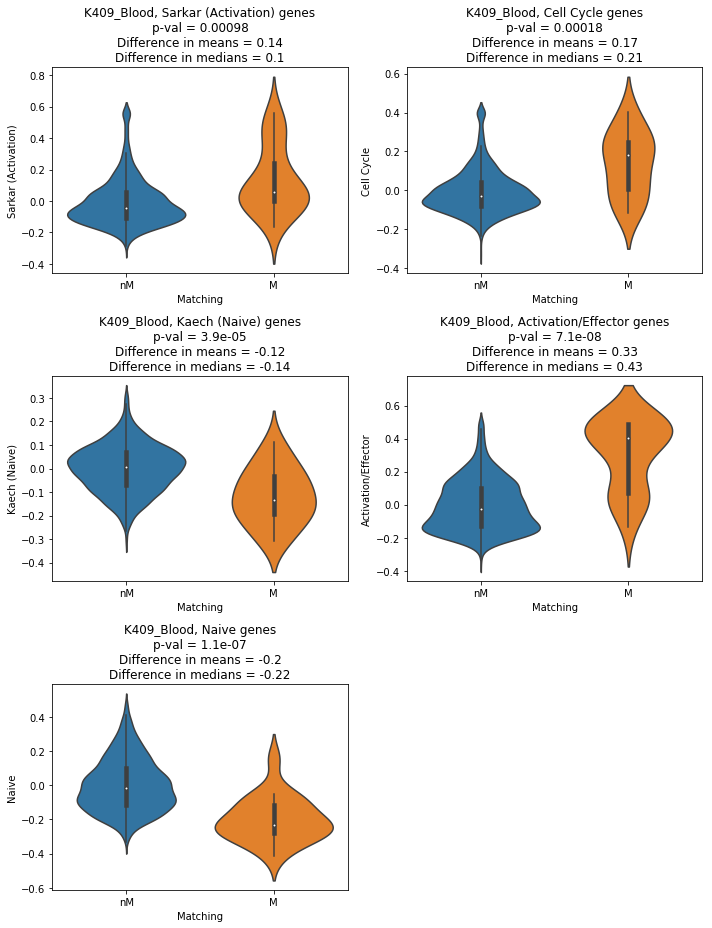

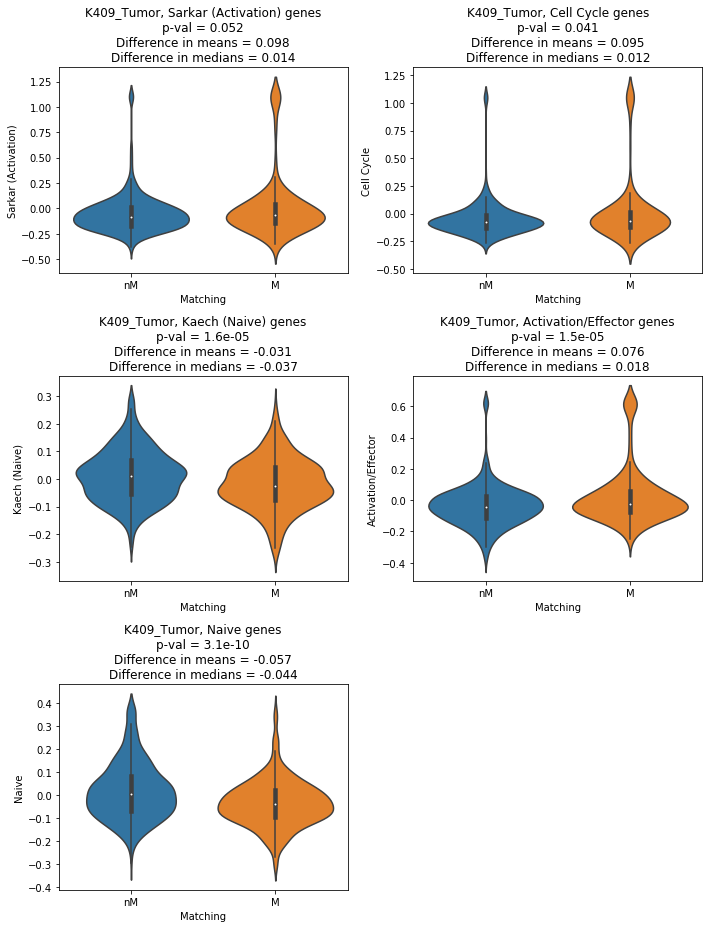

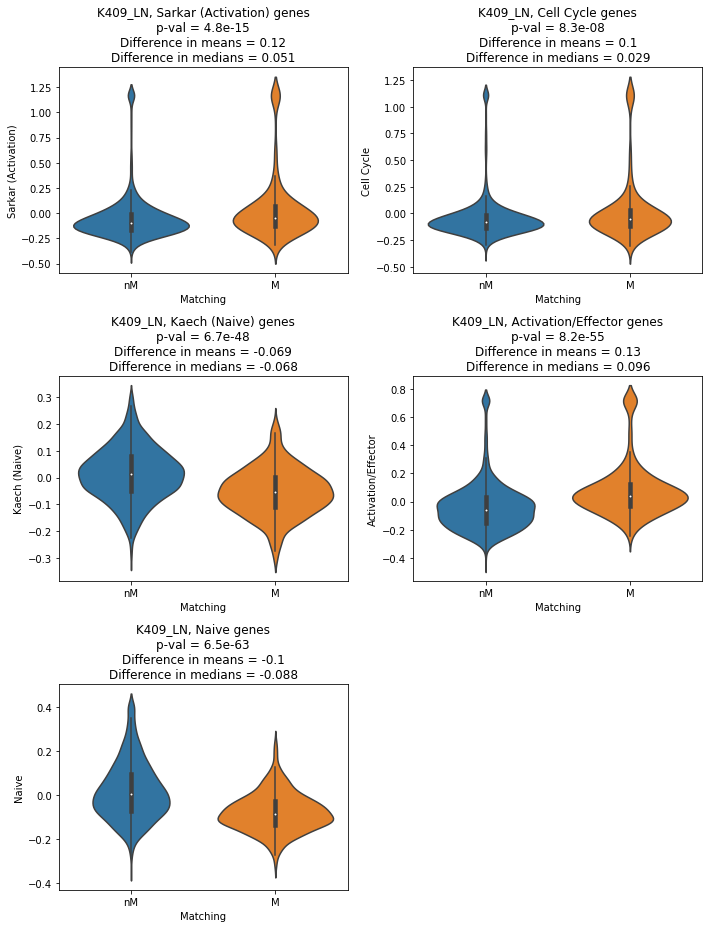

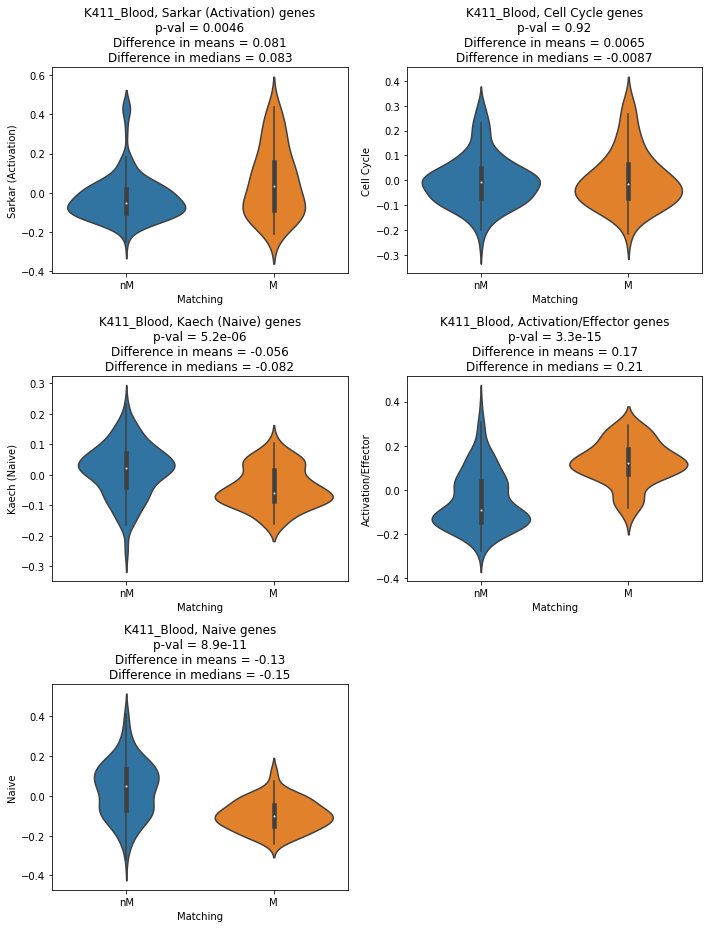

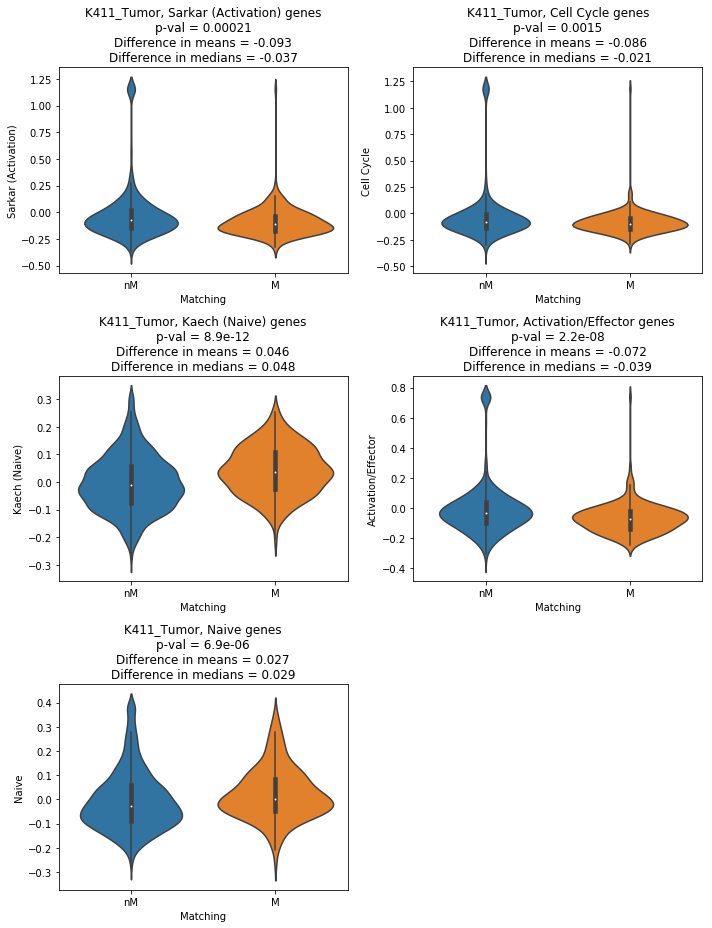

...

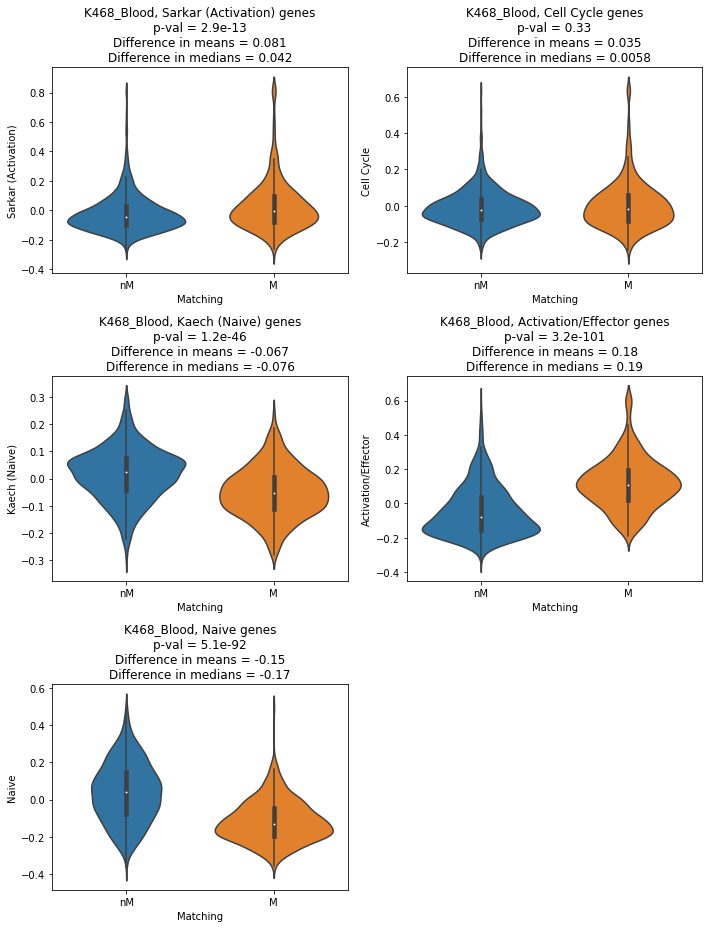

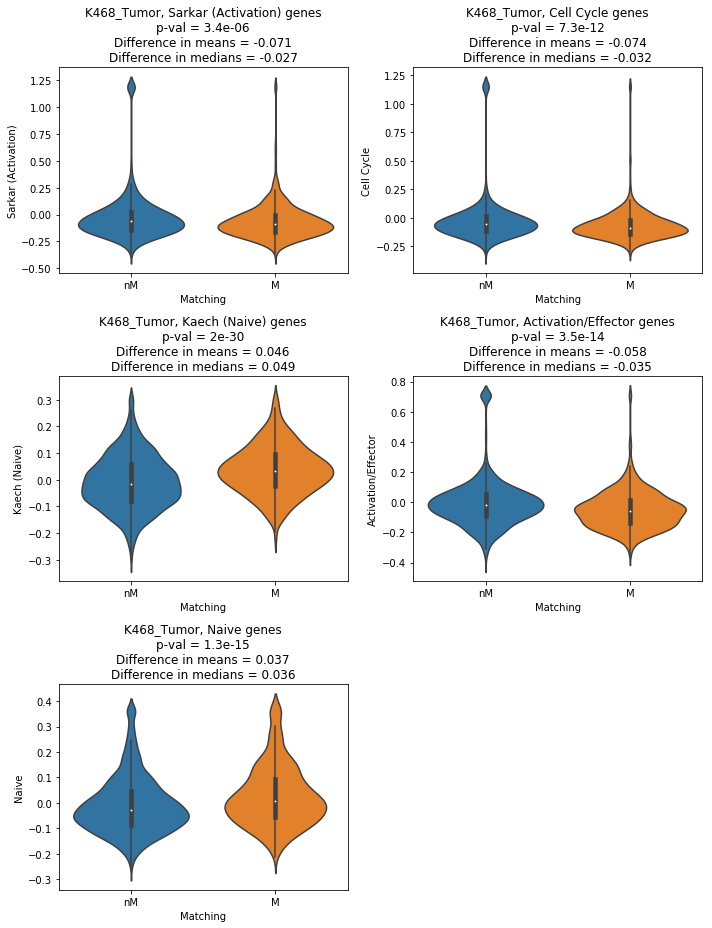

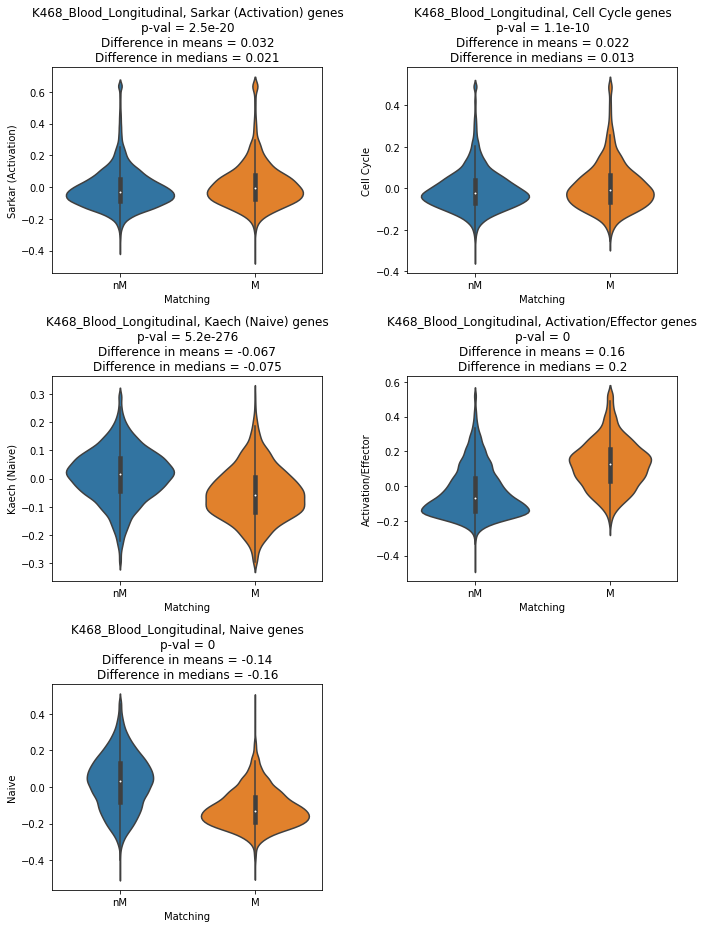

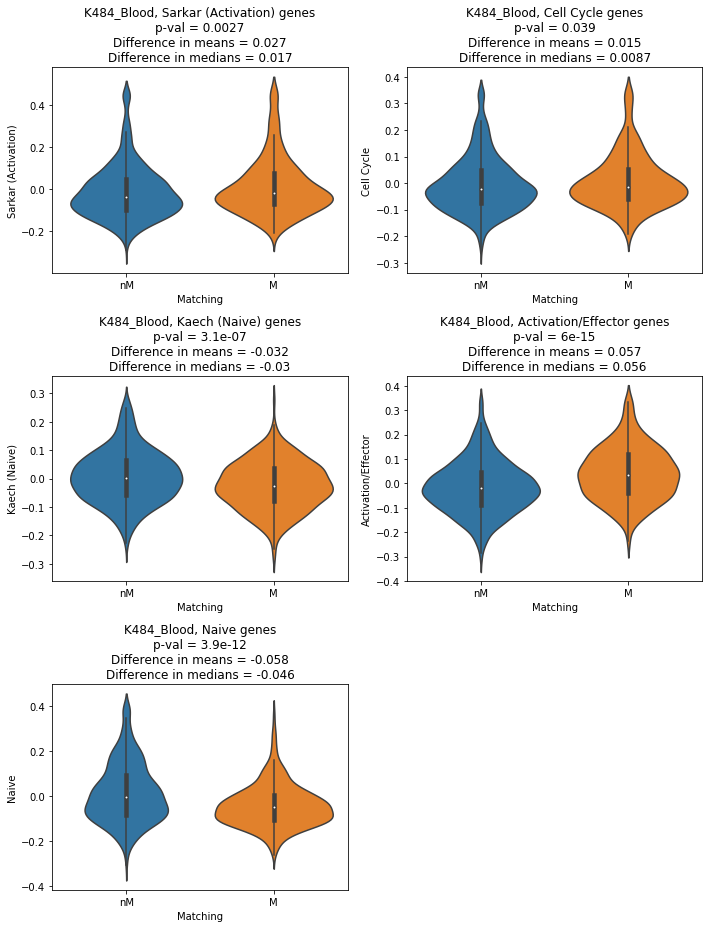

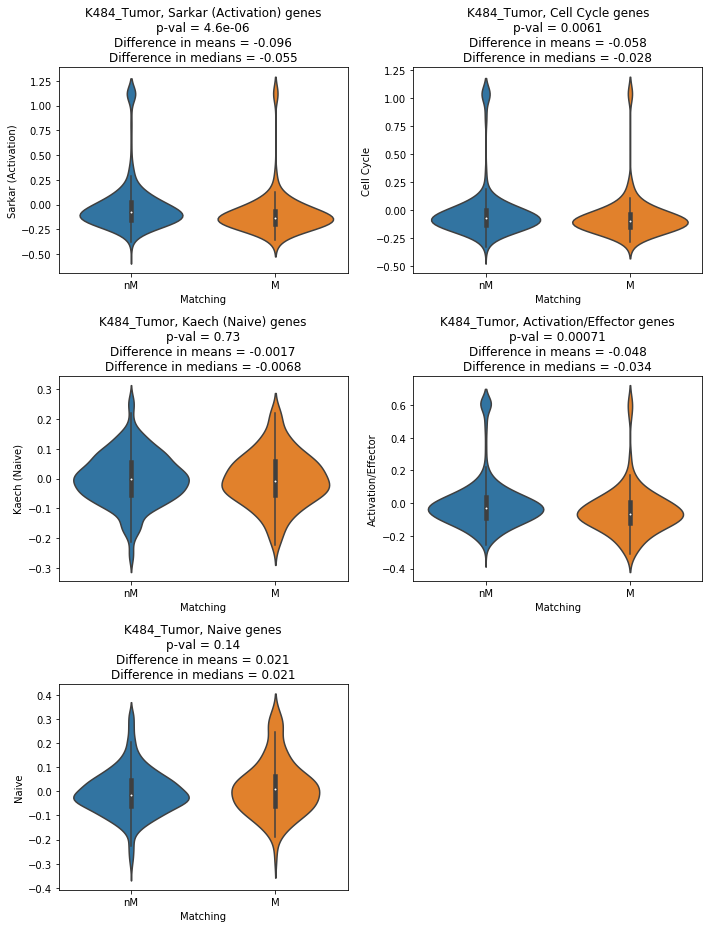

In [85]:
# Run analyses
for i,sample in enumerate(samples):
    
    fig, axes = MakeViolinPlots(sample, Adatas[i], gene_lists, gene_names, Cap = True)
    
    # Save certain plots for original blood samples
    if sample in ['K409_Blood', 'K411_Blood', 'K468_Blood', 'K484_Blood']:
        
        # Save Activation/Effector plot
        extent = axes[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/Fig4D_' + sample + '_Effector_ViolinPlot.pdf',
                    bbox_inches=extent.expanded(1.35, 1.55))
        
        # Save Naive plot
        extent = axes[2,0].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/Fig4E_' + sample + '_Naive_ViolinPlot.pdf',
                    bbox_inches=extent.expanded(1.35, 1.55))
    
    # Save certain plots for longitudinal blood samples
    if sample in ['K411_Blood_Longitudinal', 'K468_Blood_Longitudinal']:
        extent = axes[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig3_' + sample + '_Effector_ViolinPlot.pdf',
                    bbox_inches=extent.expanded(1.35, 1.55))
        
        extent = axes[2,0].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig3_' + sample + '_Naive_ViolinPlot.pdf',
                    bbox_inches=extent.expanded(1.35, 1.55))
    
    
    plt.show()

# Signature Analysis

### Create Functions

In [91]:
def MergeAdatas(Blood_adata, Tumor_adata, Long_adata = None):
    
    # Keep AB cells in blood and tumor
    Blood = AB_Clones(Blood_adata).copy()
    Tumor = AB_Clones(Tumor_adata).copy()
        
    # Add new column called 'Tissue'
    Blood.obs['Tissue'] = 'Blood'
    Tumor.obs['Tissue'] = 'Tumor'
    
    # Do the same for the longitudinal data if specified
    if Long_adata is not None:
        Long = AB_Clones(Long_adata).copy()
        Long.obs['Tissue'] = 'Long'
        
    # Merge data, taking union of genes
    # Replace any missing genes with 0's
    if Long_adata is None:
        Adata = Blood.concatenate(Tumor, join = 'outer')
        
    else:
        Adata = Blood.concatenate(Tumor, Long, join = 'outer')
        
    Adata.X = np.nan_to_num(Adata.X)
    
    # Normaliziation, logarithmize, and scale to unit variance and zero mean for each gene
    sc.pp.normalize_total(Adata, target_sum = 1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    return(Adata)

In [126]:
def CalculateTCRscores(Adata, gene_list, gene_name):
    
    # Calculate gene score    
    gene_list = IntersectionOfGenes(Adata, gene_list)
    sc.tl.score_genes(Adata, gene_list, score_name = gene_name)
    
    # Separate Adata by blood and tumor (keep only metadata)
    blood_meta = Adata[ Adata.obs['Tissue'] == 'Blood' ].obs
    tumor_meta = Adata[ Adata.obs['Tissue'] == 'Tumor' ].obs
    
    # If longitudinal data is found,
    if 'Long' in list(Adata.obs['Tissue']):
        
        # Get the metadata
        long_meta = Adata[ Adata.obs['Tissue'] == 'Long' ].obs
        
        # Get list of TCRs in all three tumors
        UniqueTCRs = list(set(blood_meta['TCR']) & set(tumor_meta['TCR']) & set(long_meta['TCR']))
        
    else:
        # Get list of TCRs in blood and tumor
        UniqueTCRs = list(set(blood_meta['TCR']) & set(tumor_meta['TCR']))
        
    UniqueTCRs = sorted(UniqueTCRs)
    
    blood_dict = {}
    tumor_dict = {} 
    long_dict = {}
    
    # For each TCR, extract the set of cells with that TCR and calculate the mean gene score.
    # Add to the respective dictionary
    for TCR in UniqueTCRs:
        blood_dict[TCR] = np.mean(blood_meta.loc[ blood_meta['TCR'] == TCR ][gene_name])
        tumor_dict[TCR] = np.mean(tumor_meta.loc[ tumor_meta['TCR'] == TCR ][gene_name])
        
        # Add long blood data if found
        if 'Long' in list(Adata.obs['Tissue']):
            long_dict[TCR] = np.mean(long_meta.loc[ long_meta['TCR'] == TCR ][gene_name])
    
    # Dataframe for blood data
    blood_df = pd.DataFrame(index = blood_dict.keys(), columns = [gene_name], data = blood_dict.values())
    blood_df['Tissue'] = 'Blood'
    
    # Dataframe for tumor data
    tumor_df = pd.DataFrame(index = tumor_dict.keys(), columns = [gene_name], data = tumor_dict.values())
    tumor_df['Tissue'] = 'Tumor'
    
    # Dataframe for longitudinal blood data
    if 'Long' in list(Adata.obs['Tissue']):
        long_df = pd.DataFrame(index = long_dict.keys(), columns = [gene_name], data = long_dict.values())
        long_df['Tissue'] = 'Long'
        
        return(blood_df, tumor_df, long_df)
    
    
    else:
        return(blood_df, tumor_df)

In [134]:
def MakeViolinPlots(sample, Blood_adata, Tumor_adata, gene_lists, gene_names,
                    Long_adata = None, figsize = (10,13)):
    
    # Merge Adata object
    Adata = MergeAdatas(Blood_adata, Tumor_adata, Long_adata)
    
    
    # Make figure and axes
    fig, axes = MakeFigAxes(ncols = 2, n_axes = len(gene_names), figsize = figsize, constrained_layout = True)
    
    # Loop over gene lists
    for i,(gene_list,gene_name) in enumerate(zip(gene_lists,gene_names)):
    
        # Calculate TCR scores
        if Long_adata is None:
            blood_df, tumor_df = CalculateTCRscores(Adata, gene_list, gene_name)
            stat,pval = scipy.stats.wilcoxon(blood_df[gene_name], tumor_df[gene_name])
            
            # Calculate difference in means and medians
            diff_mean = np.mean(tumor_df[gene_name]) - np.mean(blood_df[gene_name])
            diff_median = np.median(tumor_df[gene_name]) - np.median(blood_df[gene_name])
            
            # Make dataframe for plotting
            TCR_scores = pd.concat([blood_df, tumor_df])
            TCR_scores['TCR'] = TCR_scores.index
            
            # Hue order for plotting
            order = ['Blood', 'Tumor']
            
        else:
            blood_df, tumor_df, long_df = CalculateTCRscores(Adata, gene_list, gene_name)
            stat, p12 = scipy.stats.wilcoxon(tumor_df[gene_name], blood_df[gene_name])
            stat, p23 = scipy.stats.wilcoxon(blood_df[gene_name], long_df[gene_name])
            stat, p13 = scipy.stats.wilcoxon(tumor_df[gene_name], long_df[gene_name])

            # Calculate difference in means and medians
            diff_mean = []
            diff_mean.append(np.mean(blood_df[gene_name])-np.mean(tumor_df[gene_name]))
            diff_mean.append(np.mean(long_df[gene_name])-np.mean(blood_df[gene_name]))
            diff_mean.append(np.mean(long_df[gene_name])-np.mean(tumor_df[gene_name]))

            diff_median = []
            diff_median.append(np.median(blood_df[gene_name])-np.median(tumor_df[gene_name]))
            diff_median.append(np.median(long_df[gene_name])-np.median(blood_df[gene_name]))
            diff_median.append(np.median(long_df[gene_name])-np.median(tumor_df[gene_name]))

            # Make dataframe for plotting
            TCR_scores = pd.concat([blood_df, tumor_df, long_df])
            TCR_scores['TCR'] = TCR_scores.index
            
            # Hue order for plotting
            order = ['Tumor', 'Blood', 'Long']
        
        # Get the axis to use
        ax = axes.flatten()[i]
        
        # Make the plot
        sns.pointplot(data = TCR_scores,  x = "Tissue", y = gene_name, hue = "TCR", order = order, ax=ax)
        ax.set_ylabel('Average Score')
        ax.legend_.remove()
        
        if Long_adata is None:
            title1 = "{} for {}".format(gene_name, sample)
            title2 = "p-Value = %.2g" % pval
            title3 = "Difference in Means = %.2g" % diff_mean
            title4 = "Difference in Medians = %.2g" % diff_median
            title = title1 + "\n" + title2 + "\n" + title3 + "\n" + title4
            ax.set_title(title)
            
        else:
            # Make a title
            title1 = "{} for {}".format(gene_name, sample)
            title2 = "p-value (tumor/blood) = %.2g" % p12
            title3 = "p-value (blood/blood long) = %.2g" % p23
            title4 = "p-value (tumor/blood long) = %.2g" % p13
            title5 = "Difference in Means = {:.3f}, {:.3f}, {:.3f}".format(*diff_mean)
            title6 = "Difference in Medians = {:.3f}, {:.3f}, {:.3f}".format(*diff_median)
            title = title1 + '\n' + title2 + '\n' + title3 + '\n' + title4 + '\n' + title5 + '\n' + title6
            ax.set_title(title)
        
    fig.suptitle("Sample {}, {} unique clones\n".format(sample, len(blood_df)))
    
    return(fig, axes)

### Load Gene Names

In [136]:
gene_lists = SF_CD8
gene_names = ['CD8 1: Exhaustion/cell-cyle', 'CD8 2: Exhaustion/heat shock protein',
                      'CD8 3: Exhaustion', 'CD8 4: Memory/effector',
                      'CD8 5: Early activated cells', 'CD8 6: Memory/effector']

### Run Analysis (Blood vs. Tumor)

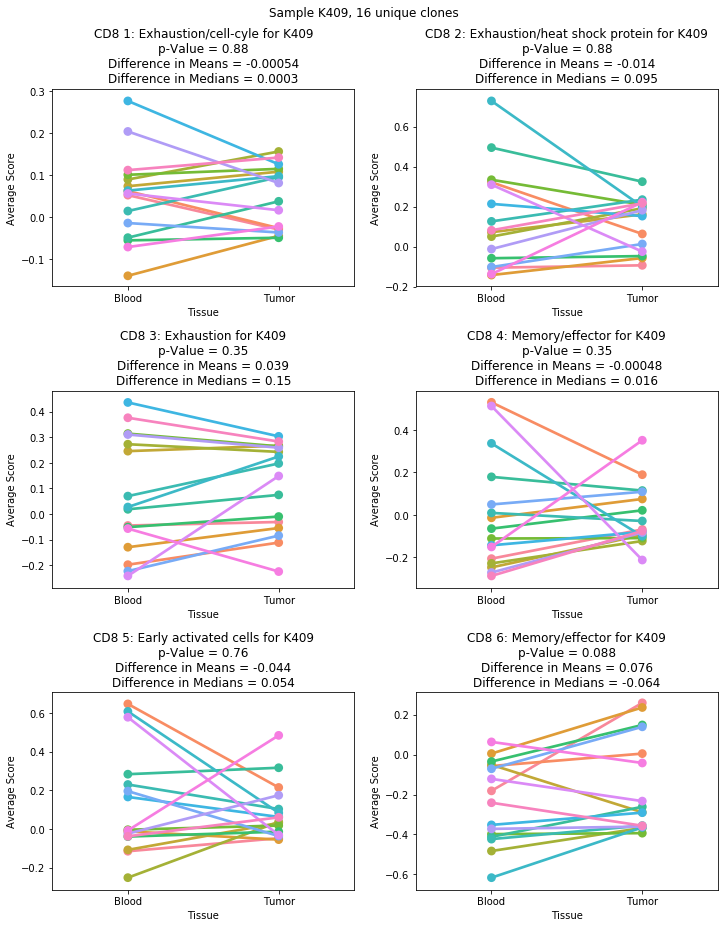

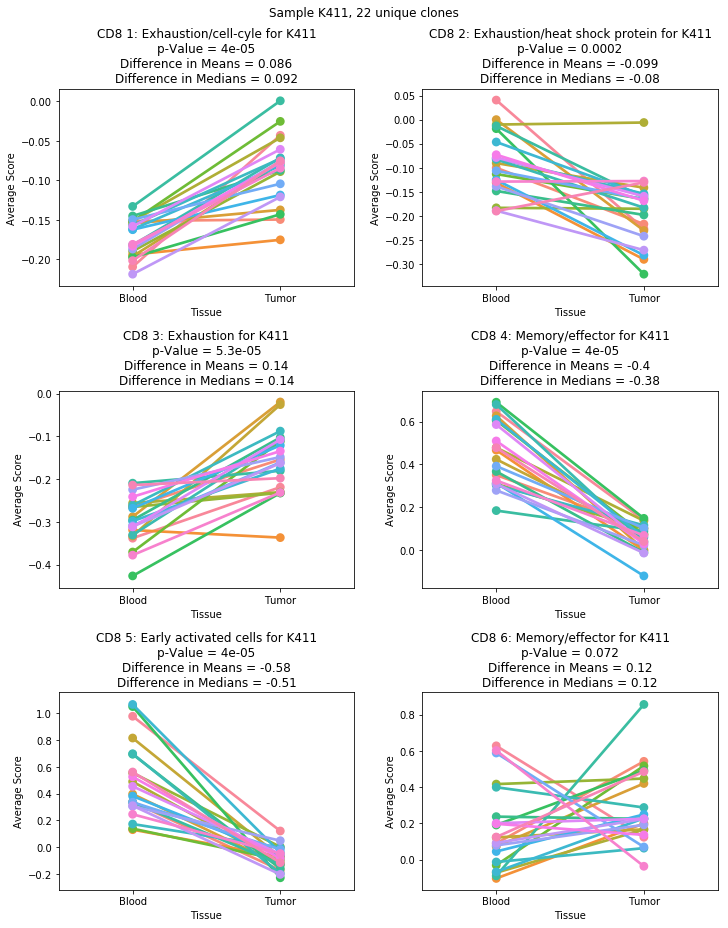

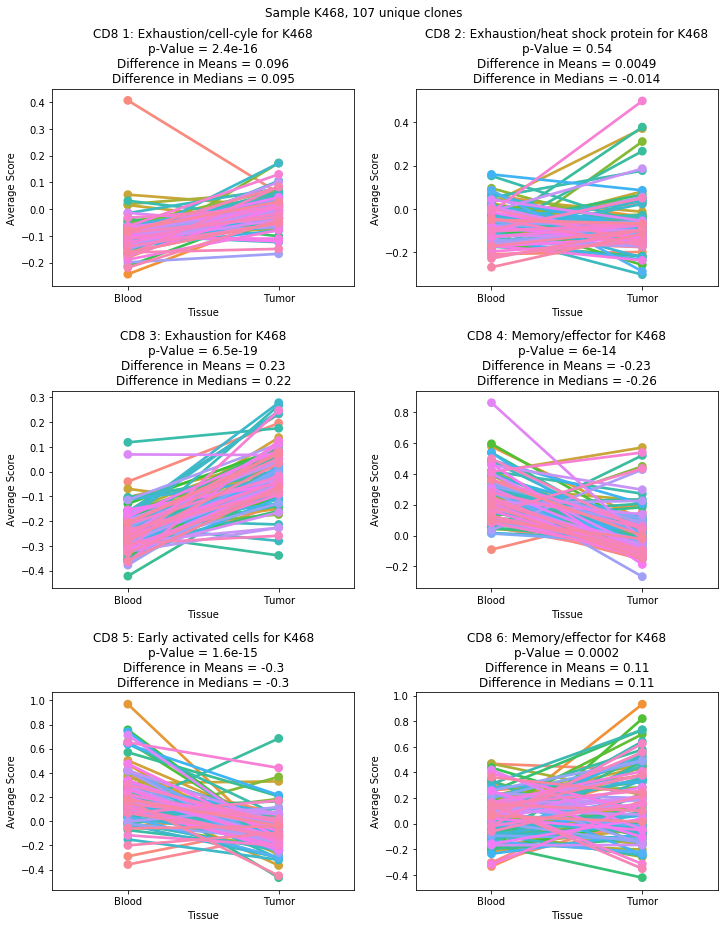

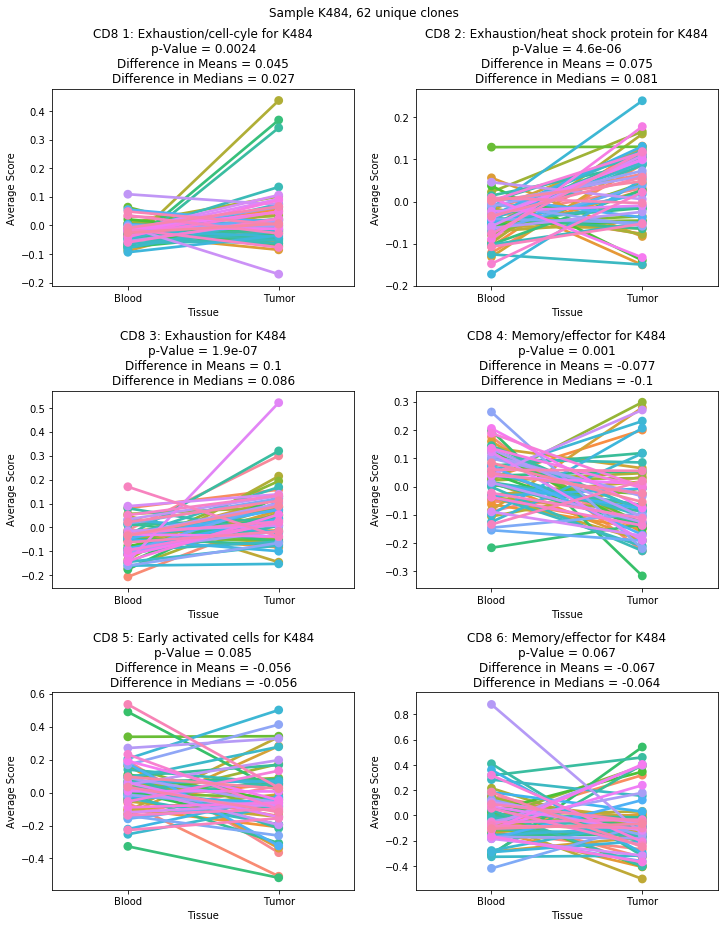

In [143]:
# K409 blood vs. tumor
# Get the index numbers
b = samples.index('K409_Blood')
t = samples.index('K409_Tumor')
ln = samples.index('K409_LN')
fig, axes = MakeViolinPlots('K409', Adatas[b], Adatas[t].concatenate(Adatas[ln]), gene_lists, gene_names)

# Save figure
extent = full_extent(axes[1,0]).transformed(fig.dpi_scale_trans.inverted())
fig.savefig('Figures/Fig4F_K409_SF_Exhausion_CloneAnalysis.pdf', bbox_inches=extent)  
plt.show()

for i,sample in enumerate(['K411', 'K468', 'K484']):
    
    # Get the index numbers
    b = samples.index(sample + '_Blood')
    t = samples.index(sample + '_Tumor')
    fig, axes = MakeViolinPlots(sample, Adatas[b], Adatas[t], gene_lists, gene_names)
    
    # Save figure
    extent = full_extent(axes[1,0]).transformed(fig.dpi_scale_trans.inverted())
    fig.savefig('Figures/Fig4F_' + sample + '_SF_Exhausion_CloneAnalysis.pdf', bbox_inches=extent)  
    plt.show()

### Run Analysis (Tumor vs. Blood vs. Blood Longitudinal)

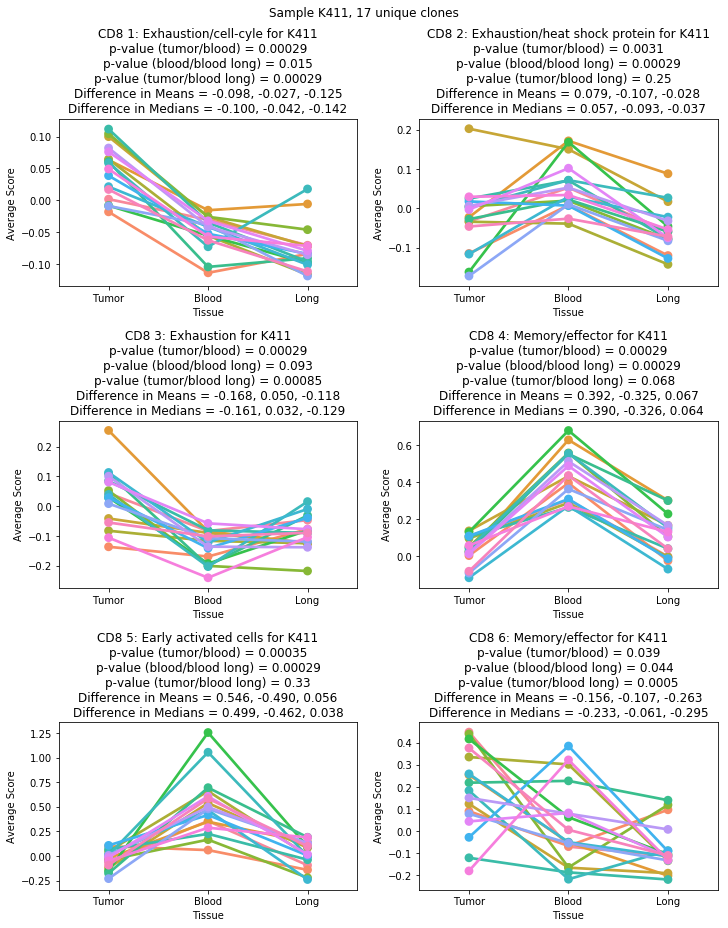

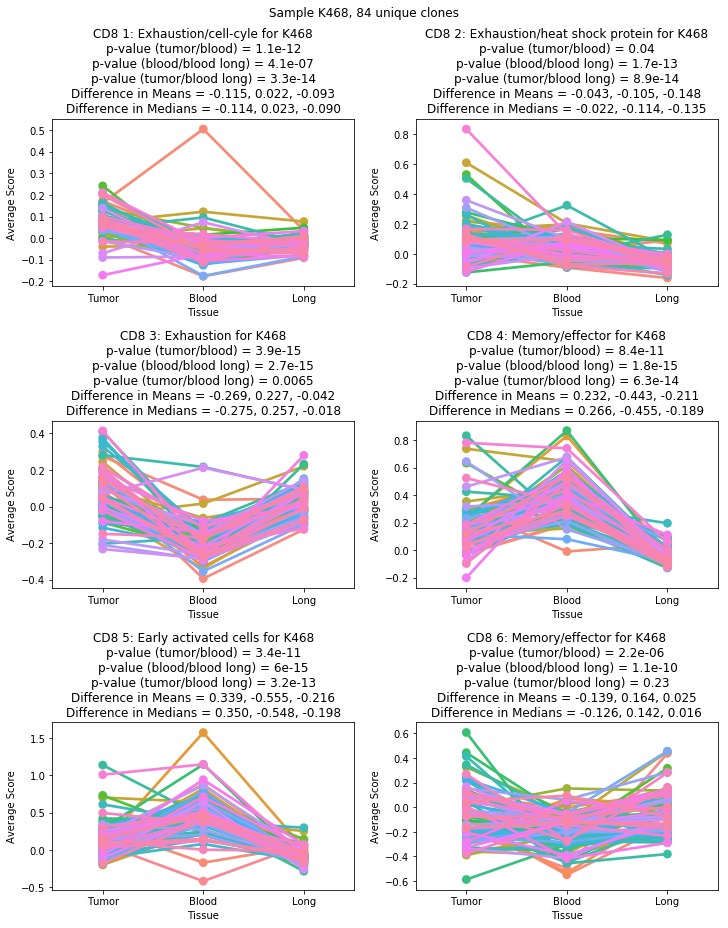

In [146]:
for i,sample in enumerate(['K411', 'K468']):
    
    # Get the index numbers
    b = samples.index(sample + '_Blood')
    t = samples.index(sample + '_Tumor')
    l = samples.index(sample + '_Blood_Longitudinal')
    fig, axes = MakeViolinPlots(sample, Adatas[b], Adatas[t], gene_lists, gene_names, Long_adata = Adatas[l])
    
    # Save figure
    extent = full_extent(axes[1,0]).transformed(fig.dpi_scale_trans.inverted())
    fig.savefig('Figures/Fig5B_' + sample + '_SF_Exhausion_CloneAnalysis.pdf', bbox_inches=extent)  
    plt.show()

# Count alpha and beta chains in TCR sequences

### Create a Function to Count Chains

In [148]:
def CountTCRchains(Adata):
    
    # Make a list of each TCR sequence for each cell
    TCR_list = list(Adata.obs['TCR'].copy())
    
    # First, find the maximum number of alpha and beta chains for the sample
    max_chain_a = 0
    max_chain_b = 0
    
    for TCR in TCR_list:
        if TCR == 'notcr':
            
            continue
            
        a = TCR.split("|")[0]
        b = TCR.split("|")[1] 
        
        if len(a.split("-")) >= max_chain_a:
            max_chain_a = len(a.split("-")) + 1
        
        if len(b.split("-")) >= max_chain_b:
            max_chain_b = len(b.split("-")) + 1
    
    # Create the numpy array
    count_array = np.zeros([max_chain_a,max_chain_b], int)

    # Now count how many alpha and beta chains there are for each cell
    for TCR in TCR_list:
        
        # If TCR isn't sequenced, just skip the TCR
        if TCR == 'notcr':
            alpha = 0
            beta = 0

            
        else:        
            # Define 'a' as the alpha chain and 'b' as the beta chain
            a = TCR.split("|")[0]
            b = TCR.split("|")[1]
            
            
            if a == '':
                alpha = 0
            else:
                alpha = len(a.split("-"))
            
            
            if b == '':
                beta = 0
            else:
                beta = len(b.split("-"))

        count_array[alpha,beta] += 1
        
    return(count_array)

### Run on Objects

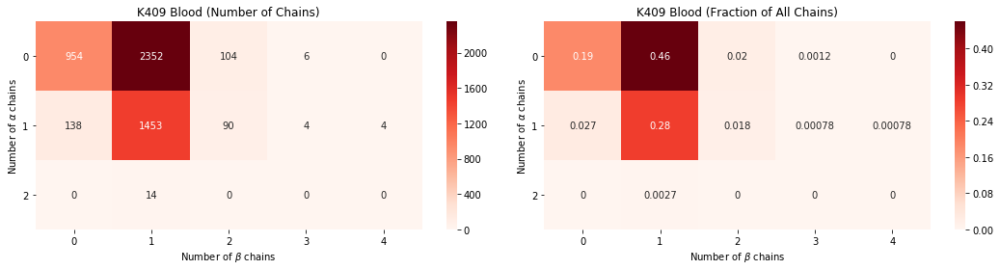

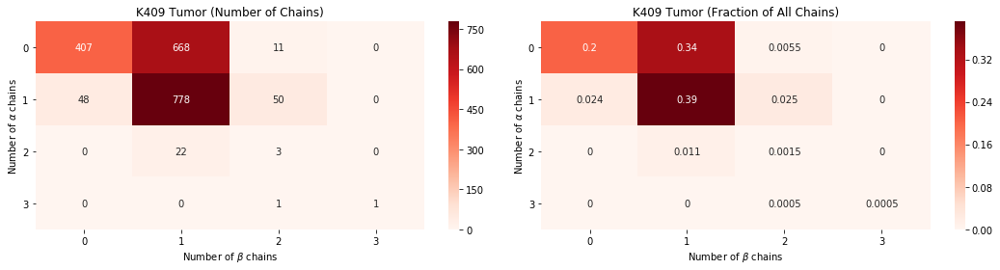

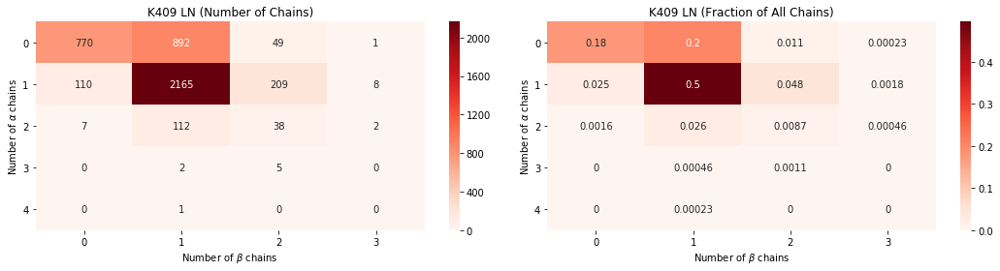

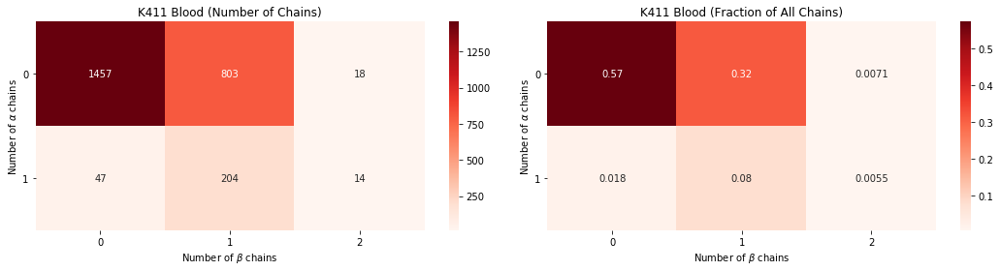

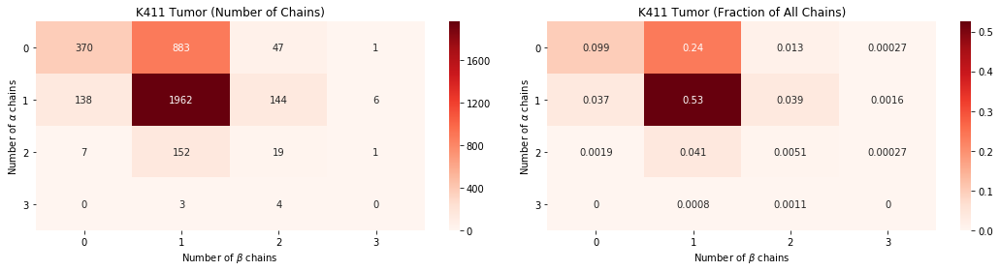

...

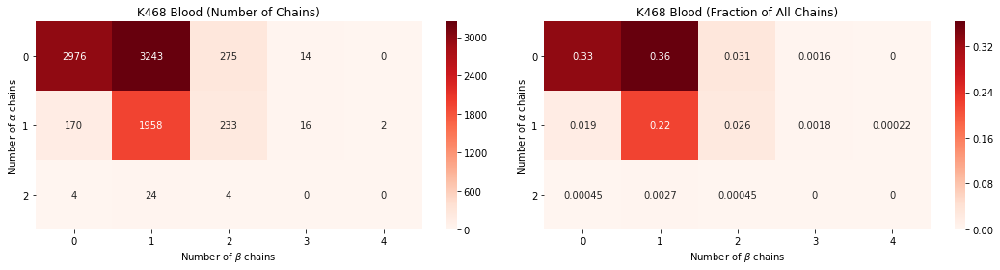

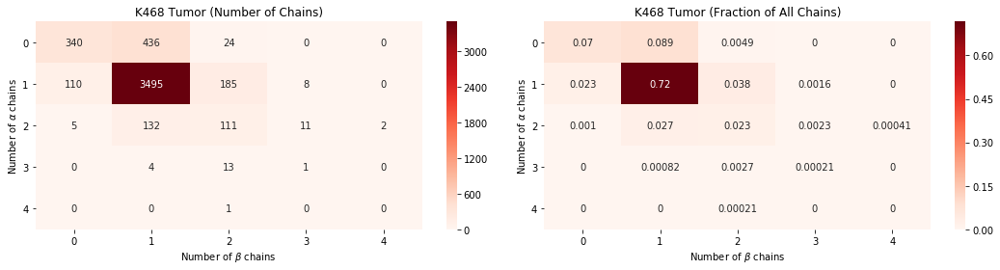

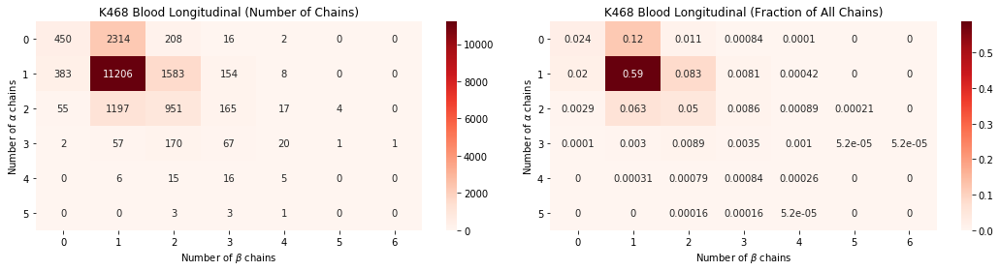

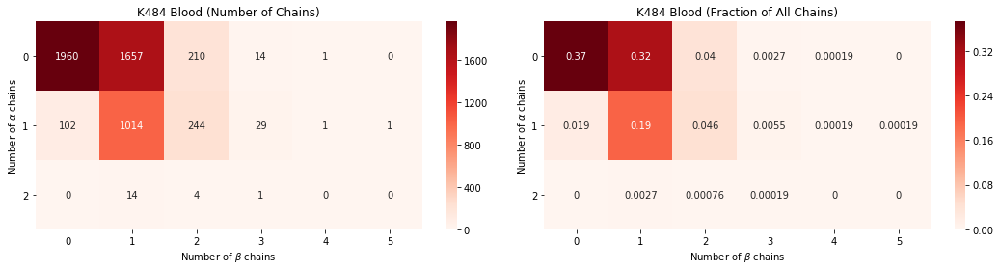

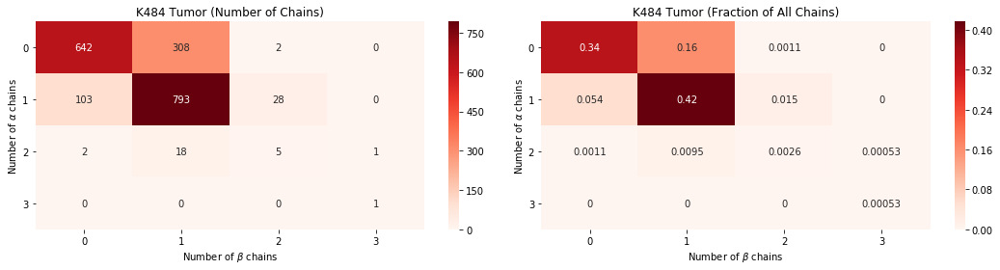

In [151]:
for i,sample in enumerate(samples):
    
    mtx = CountTCRchains(Adatas[i])
    nmtx = mtx/np.sum(mtx)


    fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,4))

    sns.heatmap(mtx, ax=ax1, cmap = 'Reds', annot=True, fmt="d")
    ax1.set_title(MakeTitle(sample) + " (Number of Chains)")
    ax1.set_xlabel(r"Number of $\beta$ chains")
    ax1.set_ylabel(r"Number of $\alpha$ chains")
    ax1.tick_params(labelrotation=0)

    sns.heatmap(nmtx, ax=ax2, cmap = 'Reds', annot=True, fmt=".2g")
    ax2.set_title(MakeTitle(sample) + " (Fraction of All Chains)")
    ax2.set_xlabel(r"Number of $\beta$ chains")
    ax2.set_ylabel(r"Number of $\alpha$ chains")
    ax2.tick_params(labelrotation=0)

    plt.tight_layout()
    plt.show()

# Make Data for SuppFig 4B

In [154]:
for i,sample in enumerate(samples):

    # Total number of GEX barcodes
    all_cells = len(Adatas[i])
    
    # Keep only AB clones; total number of AB cells
    df = AB_Clones(Adatas[i]).obs.copy()
    ab_cells = len(df)
    
    # Total number (and percent) of tumor matching cells
    matching = len(df[ df['Matching'] == 'matching'])
    perc_matching = np.round(matching/ab_cells * 100, decimals=2)
    
    # All cells that are tumor_matching in count matrix
    matching_ids = df[ df['Matching'] == 'matching' ].index
    df_mtx = Adatas[i][matching_ids, 'PDCD1'].X
    matching_PD1 = np.count_nonzero(df_mtx)
    
    # Percentage of PD1+ cells that are tumor matching
    matching_PD1 = np.round(matching_PD1/matching*100, decimals=2)
    
    data = [all_cells, ab_cells, matching, perc_matching, matching_PD1]

    print('\nFor sample {}:'.format(MakeTitle(sample)))
    print('There are {} GEX barcodes, {} AB cells, and {} tumor-matching cells.'.format(*data[:3]))
    print('{:.2f}% of AB cells are tumor matching, and {:.2f}% of tumor matching cells are PD1+.'.format(*data[3:]))


For sample K409 Blood:
There are 5119 GEX barcodes, 1565 AB cells, and 19 tumor-matching cells.
1.21% of AB cells are tumor matching, and 68.42% of tumor matching cells are PD1+.

For sample K409 Tumor:
There are 1989 GEX barcodes, 855 AB cells, and 355 tumor-matching cells.
41.52% of AB cells are tumor matching, and 71.83% of tumor matching cells are PD1+.

For sample K409 LN:
There are 4371 GEX barcodes, 2542 AB cells, and 568 tumor-matching cells.
22.34% of AB cells are tumor matching, and 66.20% of tumor matching cells are PD1+.

For sample K411 Blood:
There are 2543 GEX barcodes, 218 AB cells, and 60 tumor-matching cells.
27.52% of AB cells are tumor matching, and 3.33% of tumor matching cells are PD1+.

For sample K411 Tumor:
There are 3737 GEX barcodes, 2291 AB cells, and 207 tumor-matching cells.
9.04% of AB cells are tumor matching, and 3.38% of tumor matching cells are PD1+.

For sample K411 Blood Longitudinal:
There are 18524 GEX barcodes, 4271 AB cells, and 189 tumor-match

# Make Venn Diagrams to Find Matching TCRs

### Make Function

In [11]:
def MakeVennDiagrams(sample, ax):
    
    b = samples.index(sample + '_Blood')
    t = samples.index(sample + '_Tumor')
    l = samples.index(sample + '_Blood_Longitudinal')
    
    blood = set(AB_Clones(Adatas[b]).obs['TCR'])
    tumor = set(AB_Clones(Adatas[t]).obs['TCR'])
    long = set(AB_Clones(Adatas[l]).obs['TCR'])
    
    subsets = [len(blood - tumor),
               len(tumor - blood),
               len(blood & tumor),
               len(long - blood - tumor),
               len(blood & long),
               len(tumor & long),
               len(blood & tumor & long)]
    
    venn3_unweighted(subsets = subsets, set_labels = ('Blood', 'Tumor', 'Blood Longitudinal'), alpha = 0.5,
                    ax = ax)

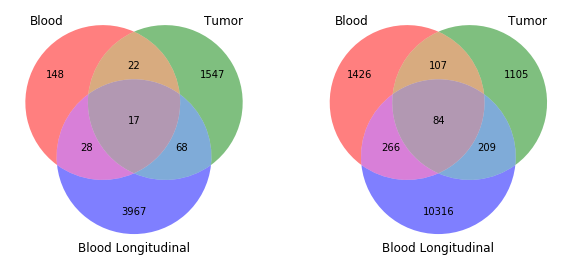

In [14]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize = (10,8))

for i,sample in enumerate(['K411', 'K468']):
    
    MakeVennDiagrams(sample, axes[i])

# Work on Integrated Data

In [171]:
# Load samples
samples = ['HumanIntegratedBlood', 'HumanIntegratedTumor']

# Initialize empty objects
Adatas = [0] * len(samples)

# Path where adata objects are located
adata_path = '/Users/oshahid/Desktop/BloodTumorData/Scanpyobjects/'

# Loop over each sample
for i,sample in enumerate(samples):
    
    Adatas[i] = anndata.read_h5ad(adata_path + sample + '.h5ad')
    
    print("{} cells in {}".format(len(Adatas[i]), sample))

21833 cells in HumanIntegratedBlood
16878 cells in HumanIntegratedTumor


# Plot Seurat Clusters on UMAPs

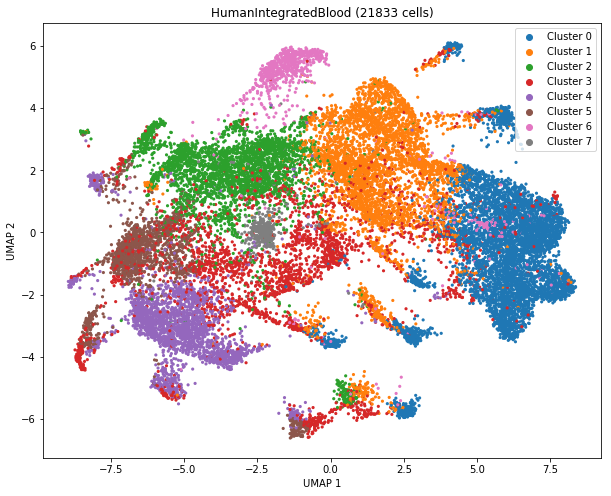

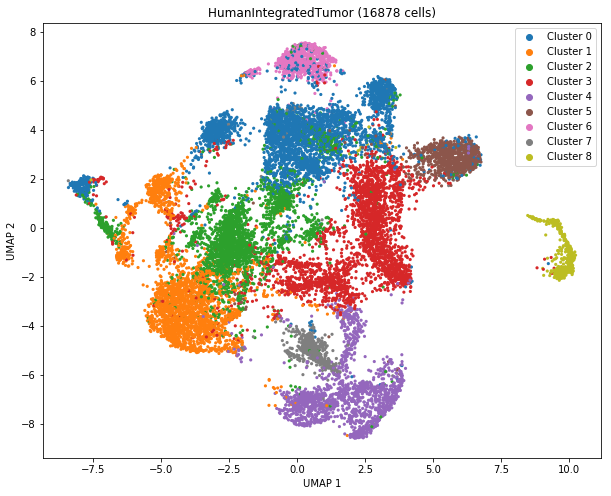

In [172]:
for i,sample in enumerate(samples):
    PlotUMAPs(Adatas[i], sample)

# Plot Certain Genes

In [256]:
def PlotGenes(Adata, sample):
    
    # Genes to plot
    genes = ['Pdcd1', 'Havcr2', 'Sell', 'Tcf7', 'Mki67', 'Gzmb']
    
    Adata = Adata.copy()
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    
    # Filter genes to keep only the ones found in each sample
    genes_to_plot = IntersectionOfGenes(genes, Adata, upper = True)
    
    # Settings for Scanpy - directory to save and file format
    sc.settings.figdir = 'Figures/'
    sc.settings.file_format_figs = 'pdf'
    
    if sample == 'HumanIntegratedBlood':
        save = 'SuppFig4G_HumanIntBlood_genes.pdf'
        
    if sample == 'HumanIntegratedTumor':
        save = 'SuppFig4H_HumanIntTumor_genes.pdf'
    
    sc.pl.umap(Adata, color = genes_to_plot, ncols = 3, color_map = PurpOr_7.mpl_colormap, save = save)

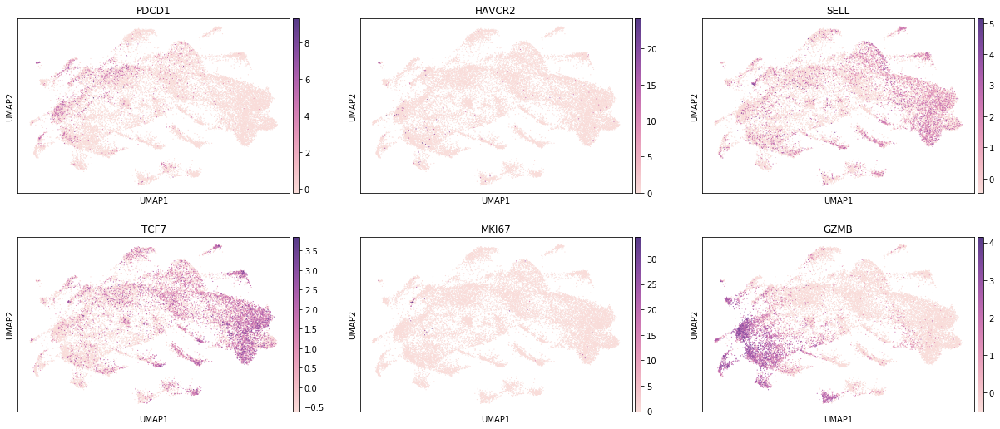

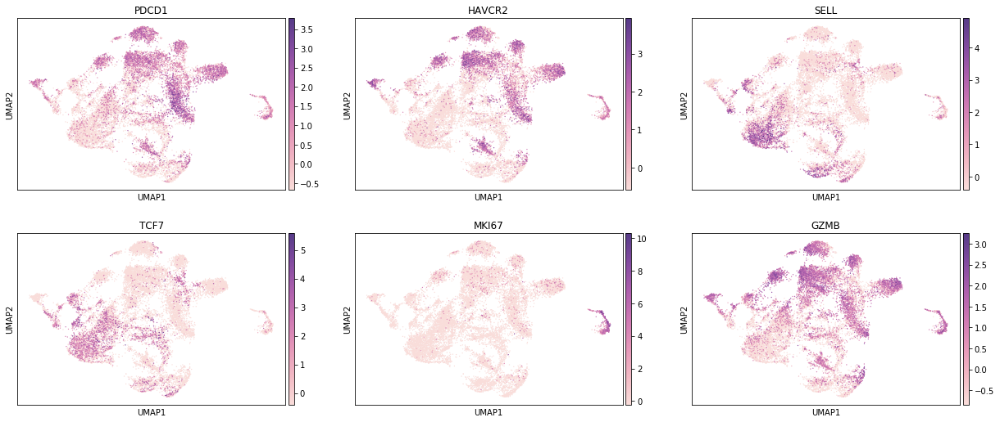

In [257]:
for i,sample in enumerate(samples):
    PlotGenes(Adatas[i], sample)

# Plot by Sample

### Create Function

In [199]:
Adatas[1].obs['Sample'].unique()

[K411_Tumor, K468_Tumor, K484_Tumor, K409_LN, K409_Tumor]
Categories (5, object): [K411_Tumor, K468_Tumor, K484_Tumor, K409_LN, K409_Tumor]

In [210]:
def PlotBySample(Adata, sample):
    """
    Plots the cells from a given sample, and color them based on which sample the cell came from.
    """
    
    # Keep only AB cells
    df = Adata.obs.copy()
    
    # Set up figure
    fig, ax = plt.subplots(figsize=(10,8))
    
    # Define colors
    if sample == 'HumanIntegratedBlood':
        palette = ['red', 'green', 'blue', 'purple']
        hue_order = ['K409_Blood', 'K411_Blood', 'K468_Blood', 'K484_Blood']
        s = 5
        
    if sample == 'HumanIntegratedTumor':
        palette = ['red', 'red', 'green', 'blue', 'purple']
        hue_order = ['K409_Tumor', 'K409_LN', 'K411_Tumor', 'K468_Tumor', 'K484_Tumor']
        s = 3
    
    # Plot data
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Sample', palette = palette,
                   hue_order = hue_order, ax = ax, s = s, linewidth = 0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(MakeTitle(sample) + ' - {} Cells'.format(len(df)))
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    
    plt.show()
    
    return fig, ax

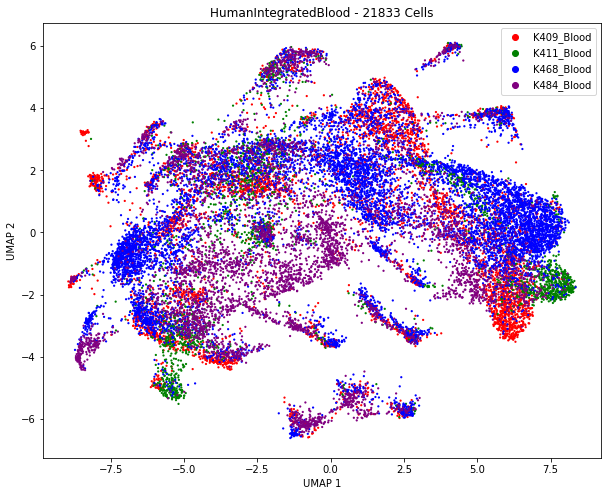

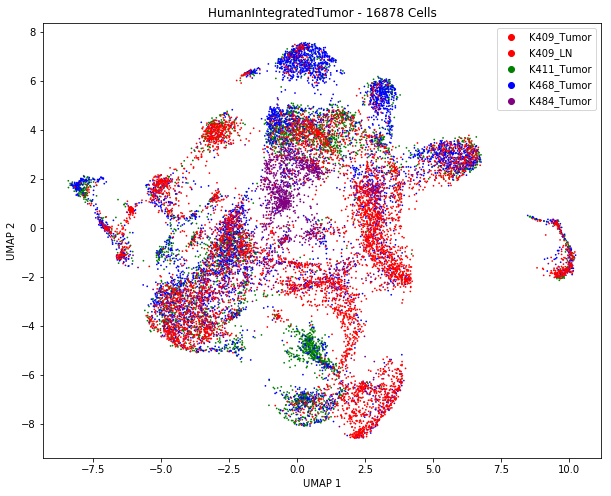

In [211]:
for i,sample in enumerate(samples):
    PlotBySample(Adatas[i], sample)

### Create Function to Plot by Individual Samples

In [219]:
def PlotByIndSamples(Adata, Sample):
    
    # Get the metadata dataframe
    df = Adata.obs.copy()
    
    # If Tumor, replace LN by tumor
    if Sample == 'HumanIntegratedTumor':
        df['Sample'].replace('K409_LN', 'K409_Tumor', inplace = True)
        
    # Set up the plot
    fig, axes = MakeFigAxes(ncols = 2, n_axes = 4, figsize = (18,16))
    colors = ['red', 'green', 'blue', 'purple']
    
    # Individual samples
    ind_samples = list(sorted(df['Sample'].unique()))
    
    for i,sample in enumerate(ind_samples):
        
        # Get the axis
        ax = axes.flatten()[i]
        
        # Subset the dataframe
        sub = df[ df['Sample'] == sample ]
        
        # Make the plot
        sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = sub, color = colors[i], ax = ax,
                        linewidth = 0, s = 4)
        
        ax.set_xlabel('UMAP 1')
        ax.set_ylabel('UMAP 2')
        ax.set_title(MakeTitle(sample) + ', {} cells'.format(len(sub)))
        
    return fig, axes

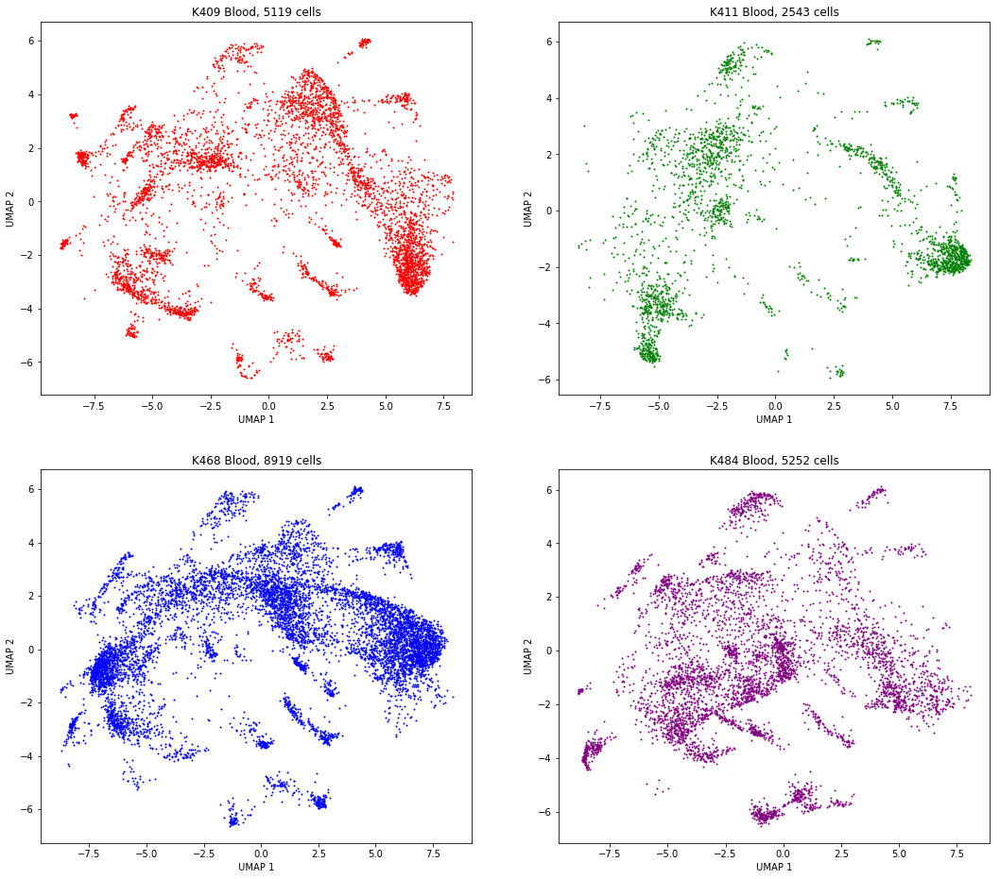

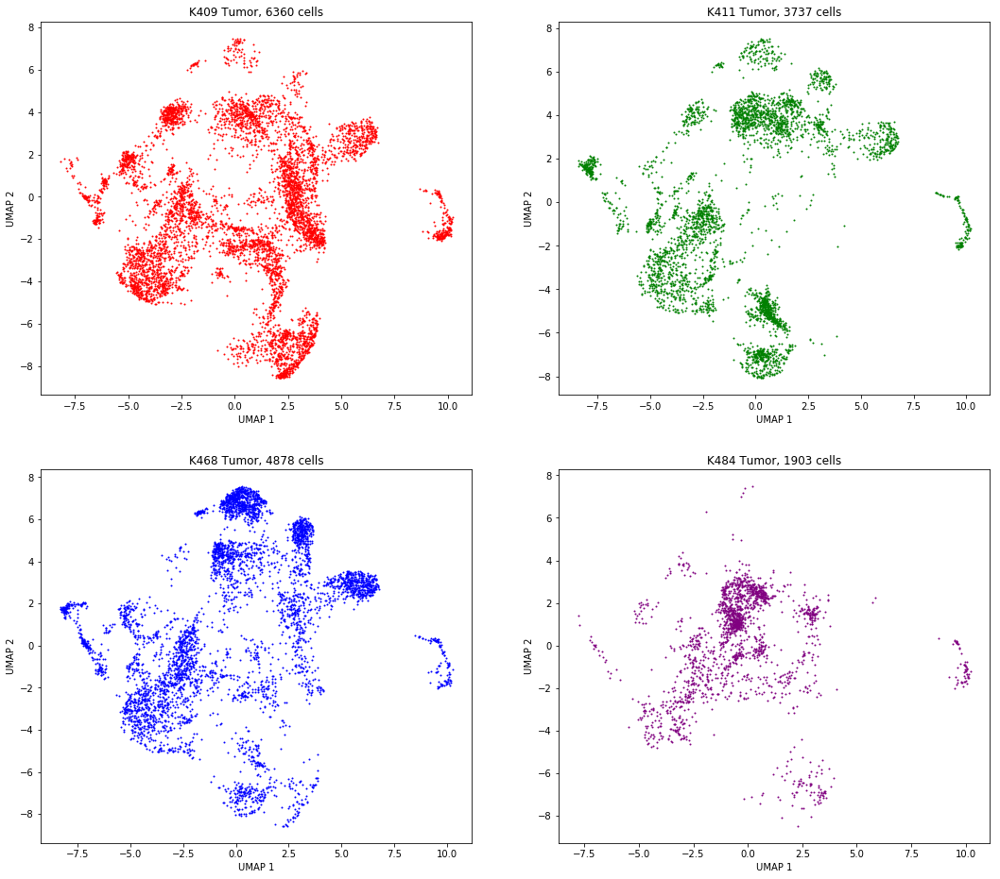

In [220]:
for i,sample in enumerate(samples):
    fig, axes = PlotByIndSamples(Adatas[i], sample)
    
    if sample == 'HumanIntegratedBlood':
        plt.savefig('Figures/SuppFig4C_HumanIntBlood_BySample.pdf')
        
    if sample == 'HumanIntegratedTumor':
        plt.savefig('Figures/SuppFig4D_HumanIntTumor_BySample.pdf')
        
    plt.show()

# Color UMAP by Matching

### Recreate Function

In [195]:
def Matching_UMAP(Adata, sample):
    """
    Plots the cells from a given sample, and color them based on whether or not the cell
    is an matching cell.
    """
    
    # Keep only AB cells
    df = AB_Clones(Adata).obs.copy()
    
    # Set up figure
    fig, ax = plt.subplots(figsize=(10,8))
    
    # Define colors
    if sample == 'HumanIntegratedBlood':
        palette = ['gray', 'brown', 'goldenrod', 'blue', 'green']
        hue_order = ['not_matching', 'K409_Blood_matching', 'K411_Blood_matching',
                     'K468_Blood_matching', 'K484_Blood_matching']
        s = 5
        
    if sample == 'HumanIntegratedTumor':
        palette = ['lightgray', 'brown', 'brown', 'blue', 'green', 'red']
        hue_order = ['not_matching', 'K409_Tumor_matching', 'K409_LN_matching', 'K411_Tumor_matching',
                     'K468_Tumor_matching', 'K484_Tumor_matching']
        s = 4
    
    # Plot data
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching', palette = palette,
                   hue_order = hue_order, ax = ax, s = s, linewidth = 0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.set_title(MakeTitle(sample) + ' - {} Cells'.format(len(df)))
    
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=labels[1:])
    
    return fig, ax

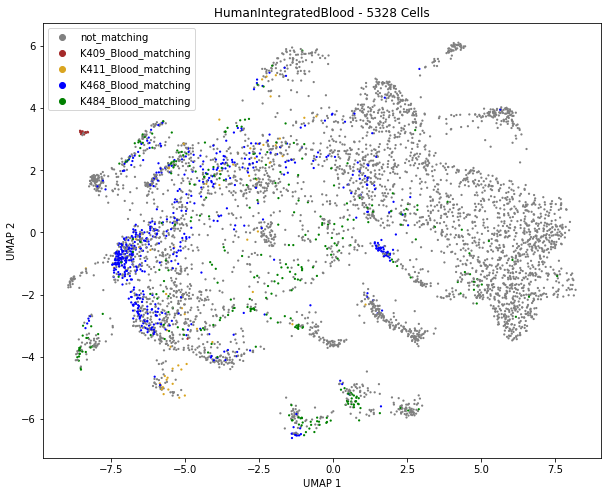

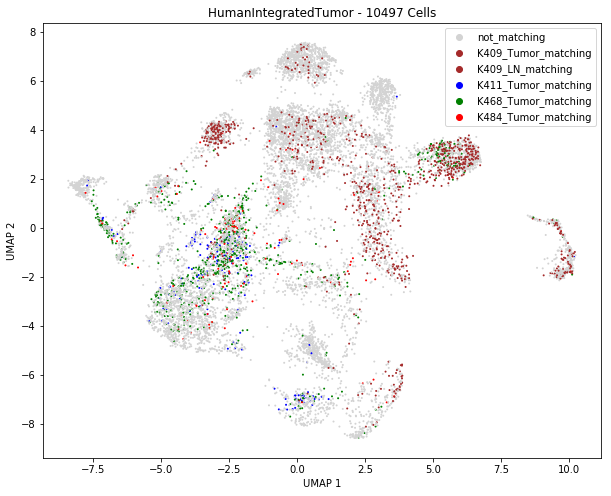

In [196]:
for i,sample in enumerate(samples):
    Matching_UMAP(Adatas[i], sample)
    
    if sample == 'HumanIntegratedBlood':
        plt.savefig('Figures/Fig4C_HumanIntBlood_ByMatching.pdf')
        
    plt.show()

### Create Function to Plot by Individual Matching

In [246]:
def PlotByIndMatching(Adata, Sample):
    
    # Get the metadata dataframe of AB cells
    df = AB_Clones(Adata).obs.copy()
    
    # If Tumor, replace LN by tumor
    if Sample == 'HumanIntegratedTumor':
        df['Matching'].replace('K409_LN_matching', 'K409_Tumor_matching', inplace = True)
        df['Sample'].replace('K409_LN', 'K409_Tumor', inplace = True)
        palette = ['navy', 'lightgray']
        
    else:
        palette = ['green', 'lightgray']
        
    # Set up the plot
    fig, axes = MakeFigAxes(ncols = 2, n_axes = 4, figsize = (18,16))
    colors = ['red', 'green', 'blue', 'purple']
    
    # Individual samples
    ind_samples = list(sorted(df['Sample'].unique()))
    
    for i,sample in enumerate(ind_samples):
        
        # Get the axis
        ax = axes.flatten()[i]
        
        # Subset the dataframe
        sub = df[ df['Sample'] == sample ]
        sub['Matching'].cat.remove_unused_categories(inplace=True)
        
        # Make the plot
        sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = sub, hue = 'Matching', ax = ax,
                        linewidth = 0, s = 4, palette = palette)
        
        ax.set_xlabel('UMAP 1')
        ax.set_ylabel('UMAP 2')
        ax.set_title(MakeTitle(sample) + ', {} cells'.format(len(sub)))
        
    return fig, axes

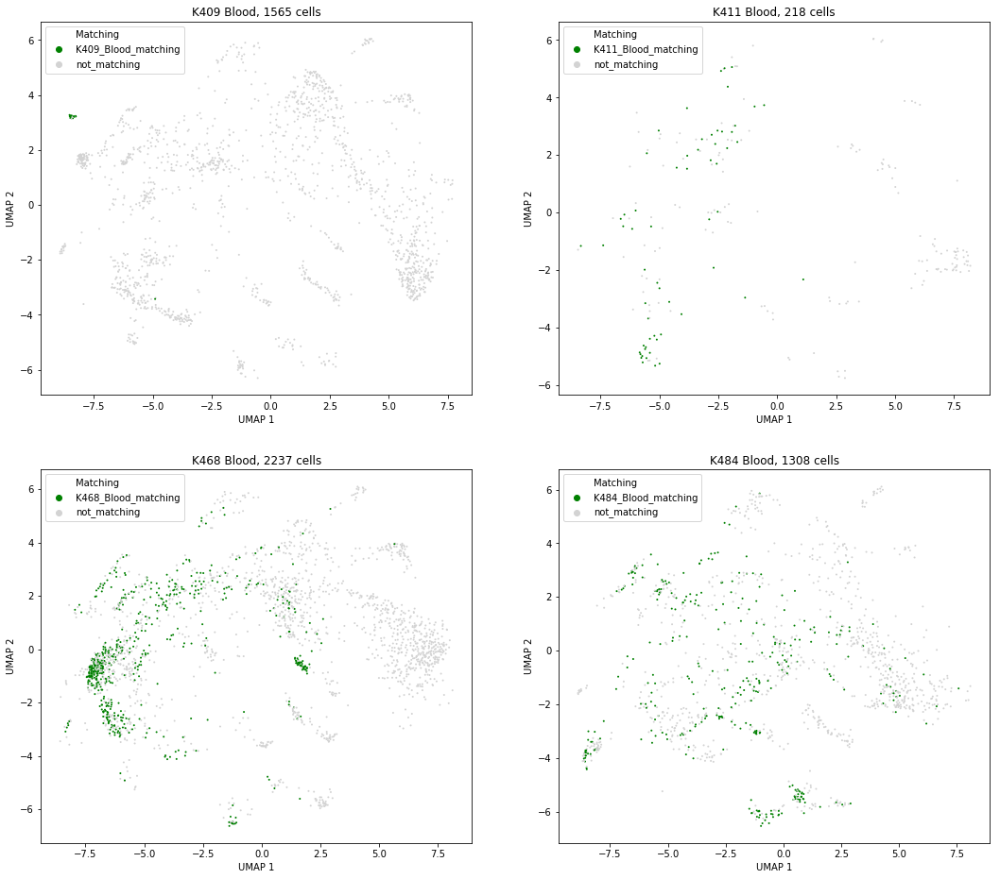

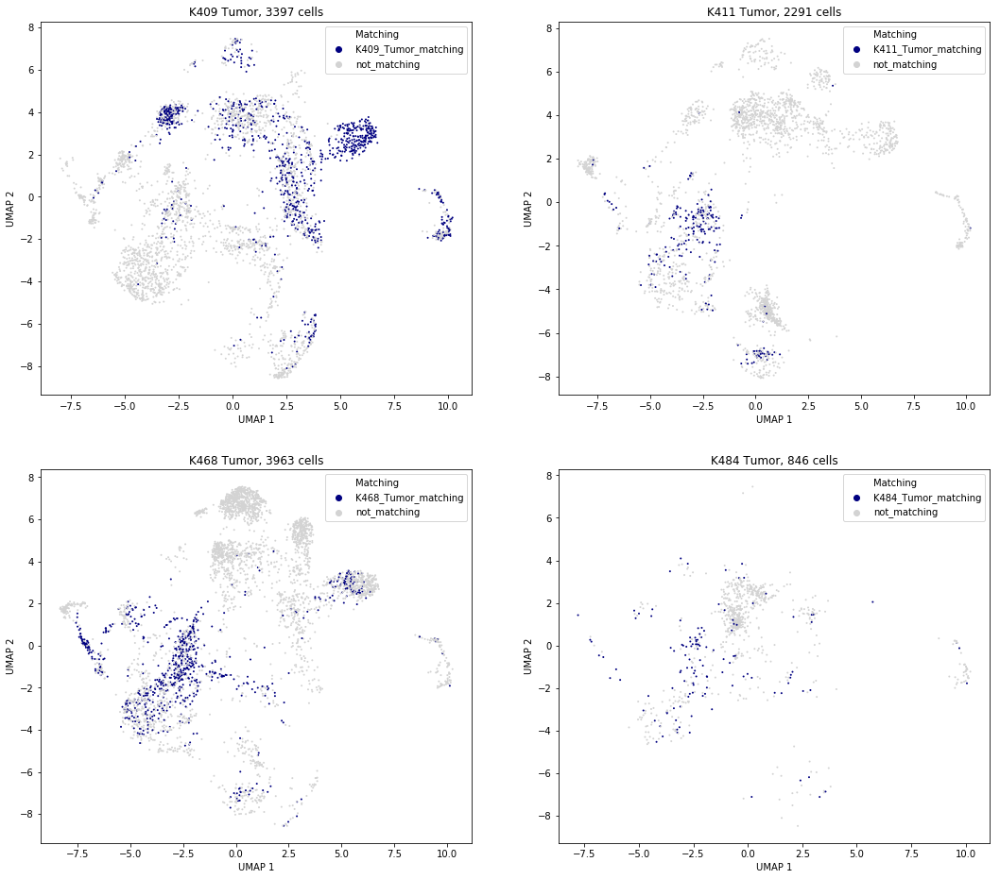

In [247]:
for i,sample in enumerate(samples):
    PlotByIndMatching(Adatas[i], sample)
    
    if sample == 'HumanIntegratedBlood':
        plt.savefig('SuppFig4E_HumanIntBlood_ByMatching.pdf')
        
    if sample == 'HumanIntegratedTumor':
        plt.savefig('SuppFig4F_HumanIntTumor_ByMatching.pdf')
        
    plt.show()